# 🏠  Predicting House Prices: A Data-Driven Approach Using Advanced Regression Techniques


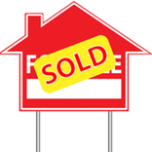

## 📊 Introduction

The aim of this task is to predict the sales price for each property in the dataset. Given that the target value is a continuous variable we will consider regression ML models. 

In [103]:
#import libraries 

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import plotly.graph_objs as go
import plotly as py
import plotly.express as px


import statsmodels.api as sm

In [104]:
# load training data 
train_data = pd.read_csv(r"C:\Users\Krupa\Downloads\train.csv")
train_data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [105]:
train_data.shape

(1460, 81)

In [106]:
num_cols = train_data.select_dtypes(['float', 'int'])
num_cols

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,1,60,65.0,8450,7,5,2003,2003,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,2,2008,208500
1,2,20,80.0,9600,6,8,1976,1976,0.0,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,1976.0,2,460,298,0,0,0,0,0,0,5,2007,181500
2,3,60,68.0,11250,7,5,2001,2002,162.0,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2001.0,2,608,0,42,0,0,0,0,0,9,2008,223500
3,4,70,60.0,9550,7,5,1915,1970,0.0,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,1998.0,3,642,0,35,272,0,0,0,0,2,2006,140000
4,5,60,84.0,14260,8,5,2000,2000,350.0,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,2000.0,3,836,192,84,0,0,0,0,0,12,2008,250000
5,6,50,85.0,14115,5,5,1993,1995,0.0,732,0,64,796,796,566,0,1362,1,0,1,1,1,1,5,0,1993.0,2,480,40,30,0,320,0,0,700,10,2009,143000
6,7,20,75.0,10084,8,5,2004,2005,186.0,1369,0,317,1686,1694,0,0,1694,1,0,2,0,3,1,7,1,2004.0,2,636,255,57,0,0,0,0,0,8,2007,307000
7,8,60,NaN,10382,7,6,1973,1973,240.0,859,32,216,1107,1107,983,0,2090,1,0,2,1,3,1,7,2,1973.0,2,484,235,204,228,0,0,0,350,11,2009,200000
8,9,50,51.0,6120,7,5,1931,1950,0.0,0,0,952,952,1022,752,0,1774,0,0,2,0,2,2,8,2,1931.0,2,468,90,0,205,0,0,0,0,4,2008,129900
9,10,190,50.0,7420,5,6,1939,1950,0.0,851,0,140,991,1077,0,0,1077,1,0,1,0,2,2,5,2,1939.0,1,205,0,4,0,0,0,0,0,1,2008,118000


In [107]:
cat_cols = train_data.select_dtypes(['object'])
cat_cols

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,NaN,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
1,RL,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,NaN,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
2,RL,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
3,RL,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,NaN,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Gd,Detchd,Unf,TA,TA,Y,NaN,NaN,NaN,WD,Abnorml
4,RL,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
5,RL,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,Gable,CompShg,VinylSd,VinylSd,NaN,TA,TA,Wood,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,NaN,Attchd,Unf,TA,TA,Y,NaN,MnPrv,Shed,WD,Normal
6,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,Stone,Gd,TA,PConc,Ex,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Gd,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
7,RL,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,Gable,CompShg,HdBoard,HdBoard,Stone,TA,TA,CBlock,Gd,TA,Mn,ALQ,BLQ,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,NaN,Shed,WD,Normal
8,RM,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,Gable,CompShg,BrkFace,Wd Shng,NaN,TA,TA,BrkTil,TA,TA,No,Unf,Unf,GasA,Gd,Y,FuseF,TA,Min1,TA,Detchd,Unf,Fa,TA,Y,NaN,NaN,NaN,WD,Abnorml
9,RL,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,Gable,CompShg,MetalSd,MetalSd,NaN,TA,TA,BrkTil,TA,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,Gd,TA,Y,NaN,NaN,NaN,WD,Normal


The test data consists of various property information, ranging from plot size to the type of foundation. In total there are 79 property features and 1,460 properties. 

### 🧹 Data Preprocessing

In [108]:
# summarise /check test data 

def check_data(df):
    summary = [
        [col, df[col].dtype, df[col].count(), df[col].nunique(), df[col].isnull().sum(), df.duplicated().sum()]
        for col in df.columns] 
    
    df_check = pd.DataFrame(summary, columns = ['column', 'dtype', 'instances', 'unique', 'missing_vals', 'duplicates'])
    pd.set_option('display.max_rows', None),
    pd.set_option('display.max_columns', None),
    pd.set_option('display.precision', 3)
                       
    return df_check

In [109]:
check_data(train_data)

,column,dtype,instances,unique,missing_vals,duplicates
0,Id,int64,1460,1460,0,0
1,MSSubClass,int64,1460,15,0,0
2,MSZoning,object,1460,5,0,0
3,LotFrontage,float64,1201,110,259,0
4,LotArea,int64,1460,1073,0,0
5,Street,object,1460,2,0,0
6,Alley,object,91,2,1369,0
7,LotShape,object,1460,4,0,0
8,LandContour,object,1460,4,0,0
9,Utilities,object,1460,2,0,0


In [110]:
print('Unique Values in Alley Column:', train_data['Alley'].unique(),  
    '%\nUnique Values in Pool Quality Column:',train_data['PoolQC'].unique(), 
    '%\nUnique Values in Fence Column:',train_data['Fence'].unique(),
    '%\nUnique Values in Miscellaneous Feature Column:',train_data['MiscFeature'].unique(),
    '%\nUnique Values in Masonry veneer type Feature Column:',train_data['MasVnrType'].unique())

Unique Values in Alley Column: [nan 'Grvl' 'Pave'] %
Unique Values in Pool Quality Column: [nan 'Ex' 'Fa' 'Gd'] %
Unique Values in Fence Column: [nan 'MnPrv' 'GdWo' 'GdPrv' 'MnWw'] %
Unique Values in Miscellaneous Feature Column: [nan 'Shed' 'Gar2' 'Othr' 'TenC'] %
Unique Values in Masonry veneer type Feature Column: ['BrkFace' nan 'Stone' 'BrkCmn']


#### Missing Values

The columns with over half of missing values are:- 

- Alley : describes the type of alley access (i.e. Gravel, paving or no alley access)
- PoolQC : rated Excellent, Good, Average/Typical, Fair or No pool  
- Fence : rated Good Privacy, Minimum Privacy, Good Wood, Minimum Wood/Wire or No Fence
- MiscFeature : indicates if there are additional features such as an elevator, shed (over 100sq/ft), second garage, tennis court, other or none 
- Masonry veneer Type: describes the masonry finish (i.e. brick, stone etc.)
   
Given the number of missing values in these columns, I think it would be reasonable to drop them. Also, I do not think they are likely to have a large impact on the sales prices. 

In [111]:
# drop columns with large number of missing values

train_data.drop(columns=['PoolQC','Alley','Fence','MiscFeature','MasVnrType', 'FireplaceQu'], axis=1, inplace=True)

In [112]:
# we will fill missing numerical data with zero 

#lot frontage
train_data['LotFrontage']=train_data['LotFrontage'].fillna(0)
train_data['MasVnrArea']=train_data['MasVnrArea'].fillna(0)

#not significant to overall analysis
train_data.dropna(subset=['BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 
                          'BsmtFinType2', 'Electrical', 'GarageType', 'GarageYrBlt',
                         'GarageFinish', 'GarageQual', 'GarageCond'], inplace=True)


#alley 
#train_data['Alley']=train_data['Alley'].fillna('Not_applicable')

#masonry
#train_data['MasVnrType']=train_data['MasVnrType'].fillna('Not_applicable')

#fireplacequal.
#train_data['FireplaceQu']=train_data['FireplaceQu'].fillna('Not_applicable')

#pool
#train_data['PoolQC']=train_data['PoolQC'].fillna('Not_applicable')

#
#train_data['Fence']=train_data['Fence'].fillna('Not_applicable')

#misc.
#train_data['MiscFeature']=train_data['MiscFeature'].fillna('Not_applicable')


In [113]:
train_data.shape

(1346, 75)

In [114]:
train_data.isnull().sum()

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual      0
TotRmsAbvGrd

In [115]:
train_data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000


In [116]:
# let's review the stats 
train_data.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1346.000,1346.000,1346.000,1346.000,1346.000,1346.000,1346.000,1346.000,1346.000,1346.000,1346.000,1346.000,1346.000,1346.000,1346.000,1346.000,1346.000,1346.000,1346.000,1346.000,1346.000,1346.000,1346.000,1346.000,1346.000,1346.000,1346.000,1346.000,1346.000,1346.000,1346.000,1346.000,1346.000,1346.000,1346.000,1346.000,1346.000,1346.00
mean,731.955,56.085,57.842,10715.473,6.226,5.592,1973.182,1985.762,109.704,465.913,48.926,582.587,1097.426,1177.604,357.133,4.197,1538.934,0.441,0.060,1.578,0.404,2.864,1.030,6.551,0.649,1978.730,1.873,501.825,99.169,48.067,21.286,3.565,16.337,2.993,42.678,6.336,2007.806,187057.31
std,421.422,41.214,35.204,10325.702,1.326,1.078,29.567,20.287,185.246,459.482,165.745,439.723,406.285,388.275,440.471,40.593,520.385,0.516,0.241,0.548,0.504,0.778,0.176,1.585,0.647,24.773,0.633,186.490,127.474,65.588,60.878,30.136,57.892,41.837,506.554,2.704,1.330,79062.79
min,1.000,20.000,0.000,1300.000,2.000,2.000,1880.000,1950.000,0.000,0.000,0.000,0.000,105.000,438.000,0.000,0.000,438.000,0.000,0.000,0.000,0.000,0.000,1.000,3.000,0.000,1900.000,1.000,160.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,2006.000,35311.00
25%,367.250,20.000,41.000,7750.000,5.000,5.000,1956.000,1968.000,0.000,0.000,0.000,248.000,822.500,894.000,0.000,0.000,1164.000,0.000,0.000,1.000,0.000,2.000,1.000,5.000,0.000,1962.000,1.000,380.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,5.000,2007.000,135000.00
50%,731.500,50.000,64.000,9600.000,6.000,5.000,1976.000,1995.000,0.000,415.500,0.000,489.000,1024.000,1099.500,0.000,0.000,1481.500,0.000,0.000,2.000,0.000,3.000,1.000,6.000,1.000,1980.000,2.000,484.000,0.000,28.000,0.000,0.000,0.000,0.000,0.000,6.000,2008.000,169500.00
75%,1098.750,70.000,80.000,11760.750,7.000,6.000,2001.750,2004.000,173.500,735.000,0.000,815.750,1327.000,1415.500,741.000,0.000,1792.000,1.000,0.000,2.000,1.000,3.000,1.000,7.000,1.000,2002.000,2.000,583.000,174.500,70.000,0.000,0.000,0.000,0.000,0.000,8.000,2009.000,220000.00
max,1460.000,190.000,313.000,215245.000,10.000,9.000,2010.000,2010.000,1600.000,5644.000,1474.000,2336.000,6110.000,4692.000,2065.000,572.000,5642.000,2.000,2.000,3.000,2.000,6.000,3.000,12.000,3.000,2010.000,4.000,1418.000,857.000,547.000,552.000,508.000,480.000,738.000,15500.000,12.000,2010.000,755000.00


Typically, features such as:-
    
- postcode
- plot size
- building type (flat, or house, terraced, semi or detached)
- number of bedrooms and bathrooms 
- proximity to amenities
- proximity to schools 
- transport links 
- condition 

can affect the sale price of a property. 

From the stats, we can understand the following: -
    
- The average house price is 180921 with the cheapest being 34900 and the most expensive being 755000
- The average lot size is 10,516 sq/ft
- The oldest property built was in 1872 and the most recent property built was 2010
- On average properties have between 2 to 3 bedrooms, with the most being 8 and the lowest being 0. 
- The average number of bathrooms is between 1 to 2
    
    

The following numerical columns are highly skewed:- 
    
    - LotArea 
    - LowQualFinSF
    - 3SsnPorch
    - PoolArea
    - MiscVal
    
Now let's apply log transformation to handle the skewness in these columns as it is effective for reducing right skewness (positive skew). It compresses large values and stretches smaller values.  


#### Datetime Values

In [117]:
#change to date columns to datetime 

train_data['YearBuilt'] = pd.to_datetime(train_data['YearBuilt'], format='%Y')
train_data['YearRemodAdd'] = pd.to_datetime(train_data['YearRemodAdd'], format='%Y')
train_data['YrSold'] = pd.to_datetime(train_data['YrSold'], format='%Y')


In [118]:
train_data['Year_Built'] = train_data['YearBuilt'].dt.year
train_data['Month_Built'] = train_data['YearBuilt'].dt.month
train_data['Day_Built'] = train_data['YearBuilt'].dt.day


train_data['Year_Remodelled'] = train_data['YearRemodAdd'].dt.year
train_data['Month_Remodelled'] = train_data['YearRemodAdd'].dt.month
train_data['Day_Remodelled'] = train_data['YearRemodAdd'].dt.day


train_data['Year_Sold'] = train_data['YrSold'].dt.year
train_data['Month_Sold'] = train_data['YrSold'].dt.month
train_data['Day_Sold'] = train_data['YrSold'].dt.day


In [119]:
#categorical data analysis 
#cat_data = train_data.copy()
#common_columns = cat_data.columns.intersection(num_data.columns)

#cat_data = cat_data.drop(columns=common_columns)

#cat_data.head()

In [120]:
#cat_data.columns

In [121]:
#cat_data = cat_data.drop(columns=['MSZoning', 'Alley', 'LotShape', 
                    #              'LandContour', 'Utilities',
      # 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       #'YearBuilt', 'YearRemodAdd', 'RoofStyle',
       #'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual',
       #'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
       #'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 
       #'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType',
       #'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC',
       #'Fence', 'MiscFeature', 'YrSold', 'SaleType', 'SaleCondition',
       #'PropAge', 'Year_Sold'])
#cat_data.shape

In [122]:
# encode the cat data

#encoded_cat_df = pd.get_dummies(cat_data)


In [123]:
#encoded_cat_df.head()

In [124]:
#concat the sale price col to encoded df
#encoded_cat_df_full = pd.concat([encoded_cat_df, train_data['SalePrice']], axis=1)
#encoded_cat_df_full.head()

In [125]:
#encoded_cat_df_full.shape

In [126]:
#corr_matrix = encoded_cat_df_full.corr()
#plt.figure(figsize=(20,10))
#sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
#plt.title("Correlation Heatmap for Categorical Data")
#plt.show()

In [127]:
#threshold=0.3
#corr_matrix = one_hot_df.corr()
#filtered_corr = corr_matrix[(corr_matrix >=threshold) | (corr_matrix <= -threshold)]
#plt.figure(figsize=(20,15))
#sns.heatmap(corr_matrix, annot=False, cmap='coolwarm', fmt='.2f',vmin=-1, vmax=1)
#plt.title("Correlation Heatmap Data")
#plt.show()

### 🔍 EDA ... Let's dive deeper into the data and do some analysis 

#### House sale price distribution 

In [131]:
train_data['SalePrice'].describe()

count      1346.00
mean     187057.31
std       79062.79
min       35311.00
25%      135000.00
50%      169500.00
75%      220000.00
max      755000.00
Name: SalePrice, dtype: float64

In [128]:
market_value_mean=train_data['SalePrice'].mean()
market_value_med=train_data['SalePrice'].median()

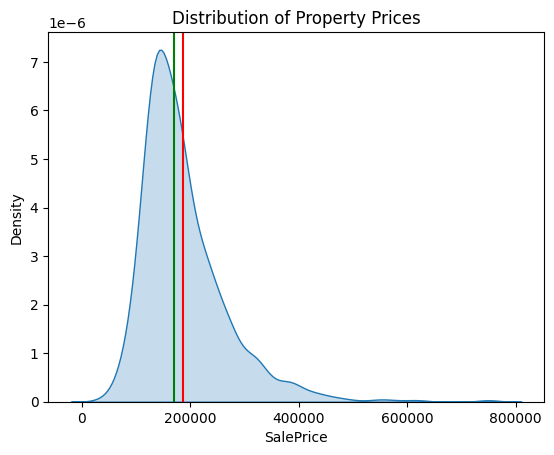

In [133]:

sns.kdeplot(train_data['SalePrice'],fill=True)
plt.axvline(x=market_value_mean, color='r', linestyle='-')
plt.axvline(x=market_value_med, color='g', linestyle='-')
plt.title('Distribution of Property Prices')
plt.show()




The mean property sale price is under 187,000 and the median is even lower. The majority of properties in this dataset are priced closer to the median approx. 170,000

In [164]:
#Are sale prices skewed?

train_data['SalePrice'].skew(axis=0)

1.9426800060087852

In [165]:
sm.stats.stattools.robust_skewness(train_data['SalePrice'])

(1.9405143874797457,
 0.18823529411764706,
 0.3193592500831606,
 0.22215046289369939)

From the kde plot and the kurtosis values, it's fair to say that property sale prices do not contain much skewness, and therefore less outlier-prone distribution.

#### Correlation Analysis 

In [167]:
num_data = train_data.select_dtypes(include = ['int', 'float'])
num_data.columns

Index(['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual',
       'OverallCond', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF',
       'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
       'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt',
       'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold', 'SalePrice', 'Year_Built', 'Month_Built', 'Day_Built',
       'Year_Remodelled', 'Month_Remodelled', 'Day_Remodelled', 'Year_Sold',
       'Month_Sold', 'Day_Sold', 'PropAge'],
      dtype='object')

In [175]:
cat_corr = num_data.corrwith(num_data['SalePrice'], method='spearman')
golden_features = cat_corr[abs(cat_corr) > 0.4].sort_values(ascending=False)
golden_features = golden_features.drop('SalePrice')
print("There are {} strongly correlated values with SalePrice:\n{}".format(len(golden_features), golden_features))

There are 15 strongly correlated values with SalePrice:
OverallQual        0.804
GrLivArea          0.736
GarageCars         0.670
FullBath           0.656
Year_Built         0.644
GarageArea         0.616
GarageYrBlt        0.590
Year_Remodelled    0.577
1stFlrSF           0.576
TotalBsmtSF        0.570
TotRmsAbvGrd       0.548
Fireplaces         0.493
OpenPorchSF        0.483
LotArea            0.445
PropAge           -0.640
dtype: float64


C:\Users\Krupa\AppData\Local\Programs\Python\Python310\lib\site-packages\scipy\stats\_stats_py.py:5445: ConstantInputWarning:

An input array is constant; the correlation coefficient is not defined.



### Univariate Analysis of Key Features

#### Numerical Data

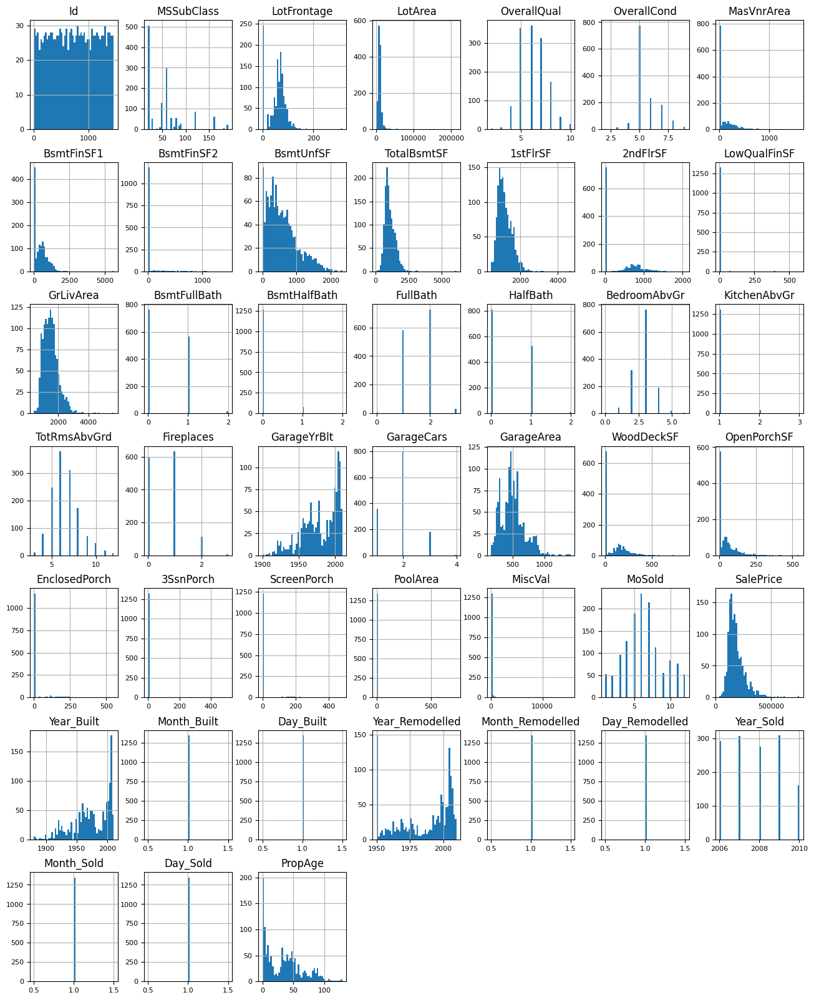

In [176]:
num_data.hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8);

From the above density plots we can decipher the following insights: -

- homebuilding has grown steadily since the early 1900s and hit a peak in the early 2000's 
- garages became more popular from the 1920s and have steadily grown 
- most of the sale prices are less than $500,000.00
- May to July are peak performing sale months 
- most garages are less than 1000 sq.ft
- most GF living areas are up to 2000 sq.ft
    

let's zoom in on the top features 

In [ ]:
OverallQual        0.804
GrLivArea          0.736
GarageCars         0.670
FullBath           0.656
Year_Built         0.644
GarageArea         0.616

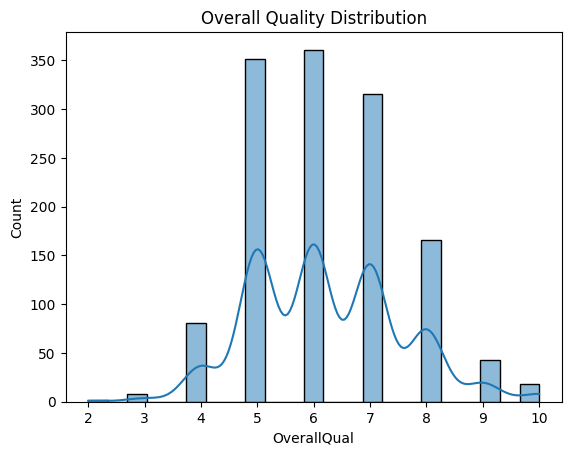

In [178]:
sns.histplot(train_data['OverallQual'], kde=True)
plt.title('Overall Quality Distribution')
plt.show()

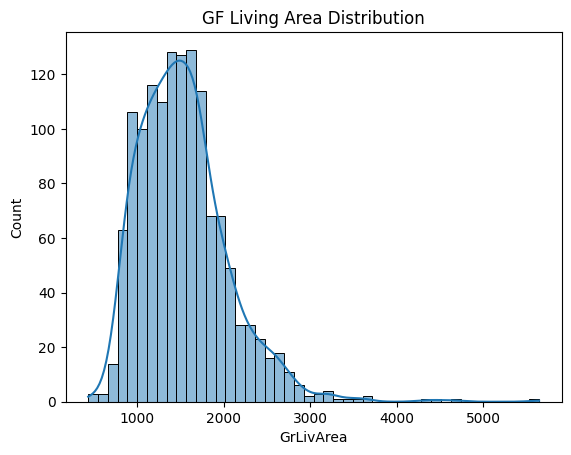

In [179]:
sns.histplot(train_data['GrLivArea'], kde=True)
plt.title('GF Living Area Distribution')
plt.show()

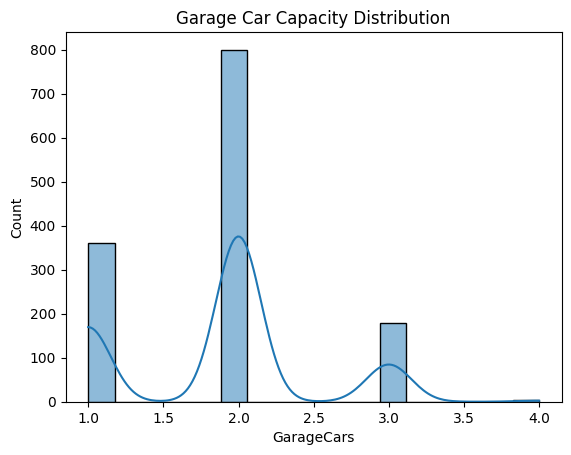

In [180]:
sns.histplot(train_data['GarageCars'], kde=True)
plt.title('Garage Car Capacity Distribution')
plt.show()

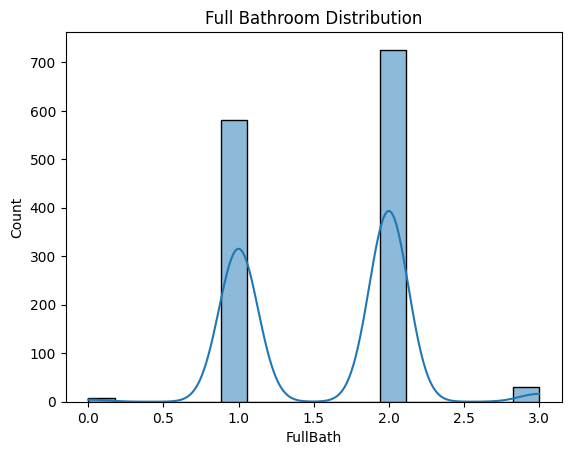

In [182]:
sns.histplot(train_data['FullBath'], kde=True)
plt.title('Full Bathroom Distribution')
plt.show()

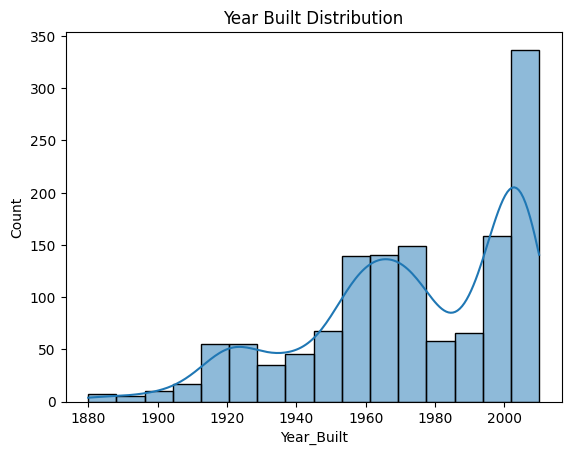

In [183]:
sns.histplot(train_data['Year_Built'], kde=True)
plt.title('Year Built Distribution')
plt.show()

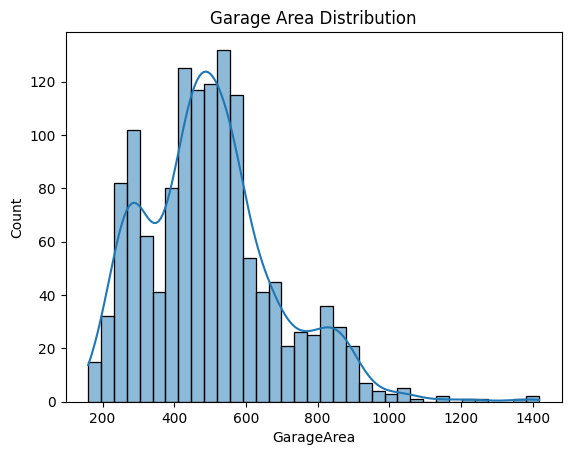

In [184]:
sns.histplot(train_data['GarageArea'], kde=True)
plt.title('Garage Area Distribution')
plt.show()

#### Categorical Data

In [186]:
cat_data = train_data.select_dtypes(['object'])
cat_data.head()

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
0,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
1,RL,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
2,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
3,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Detchd,Unf,TA,TA,Y,WD,Abnorml
4,RL,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal


#### Does location matter? 

C:\Users\Krupa\AppData\Local\Temp\ipykernel_32376\2889907264.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Neighborhood',y='SalePrice',data=train_data, palette='rainbow')


Text(0.5, 1.0, 'Property Price Dsitribution by Neighborhood')

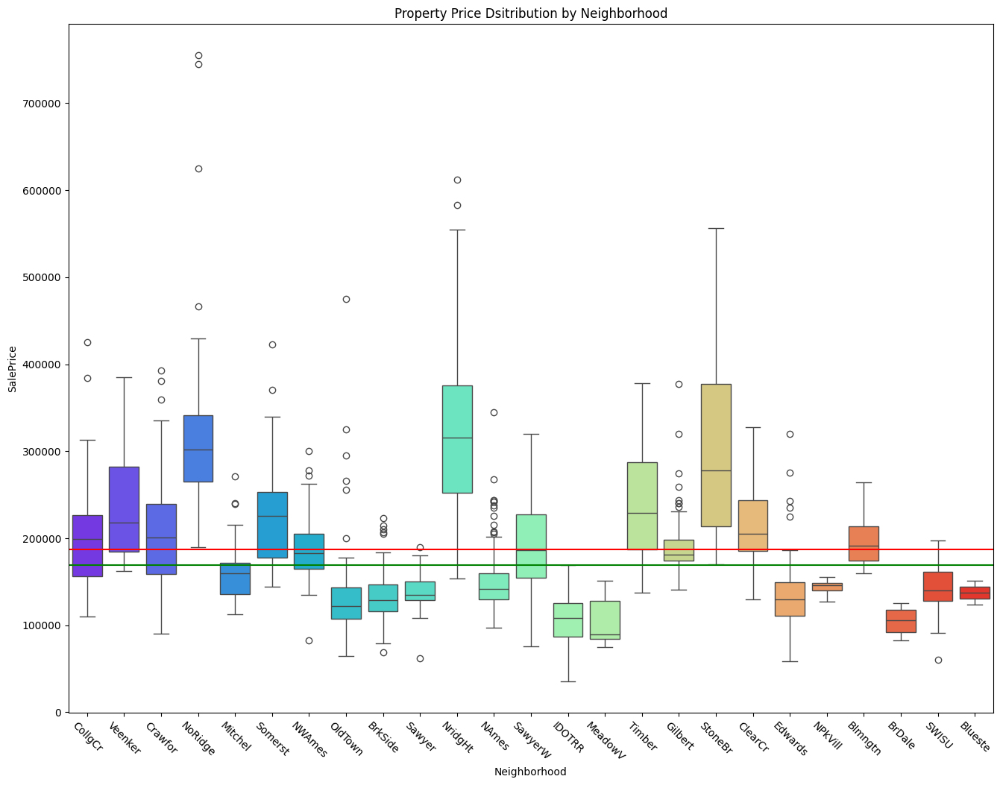

In [130]:
# how does the neighborhood affect sale price?

plt.figure(figsize=(16,12))
sns.boxplot(x='Neighborhood',y='SalePrice',data=train_data, palette='rainbow')
plt.xticks(rotation=-45)
plt.axhline(y=market_value_mean, color='r', linestyle='-')
plt.axhline(y=market_value_med, color='g', linestyle='-')
plt.title("Property Price Dsitribution by Neighborhood")

From the boxplots above we can see that properties sell for a lot more than average in Northridge Heights, whereas Meadow V is on the lower on end of the scale. The average sold property price is approx. 180,000

C:\Users\Krupa\AppData\Local\Temp\ipykernel_32376\4080002143.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Neighborhood',y='OverallQual',data=train_data, palette='rainbow')


Text(0.5, 1.0, 'Overall Quality of Property Dsitribution by Neighborhood')

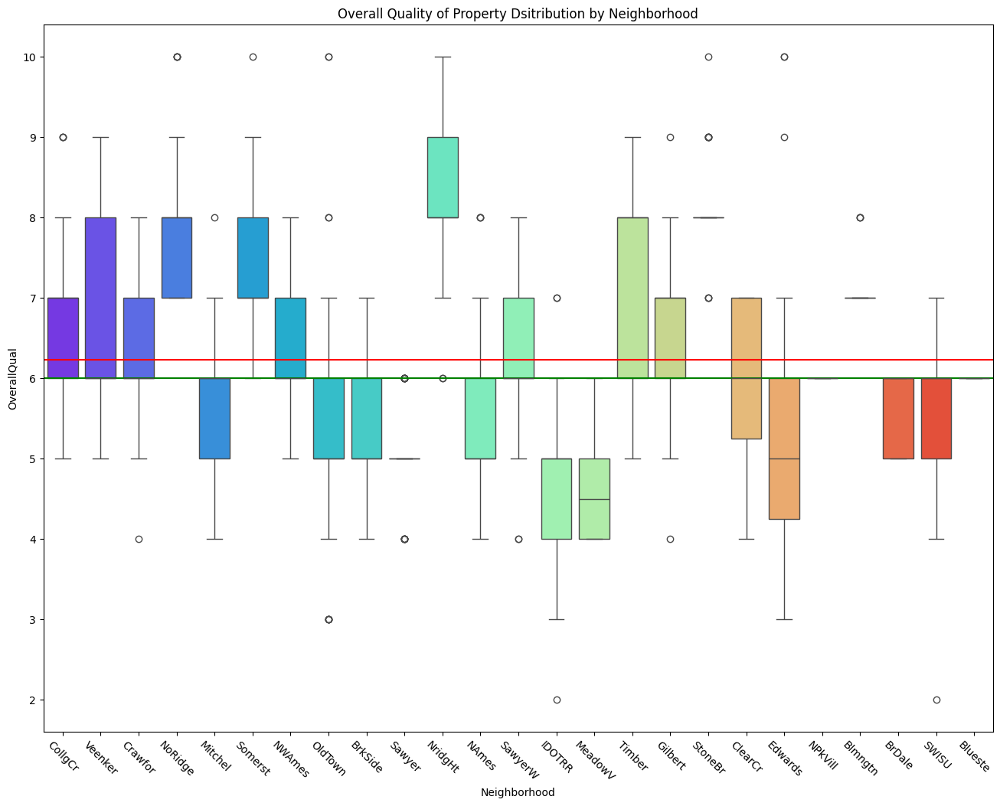

In [134]:
#is there any correlation between overall quality of property and neighborhood? 

quality_value_mean=train_data['OverallQual'].mean()
quality_value_med=train_data['OverallQual'].median()
plt.figure(figsize=(16,12))
sns.boxplot(x='Neighborhood',y='OverallQual',data=train_data, palette='rainbow')
plt.xticks(rotation=-45)
plt.axhline(y=quality_value_mean, color='r', linestyle='-')
plt.axhline(y=quality_value_med, color='g', linestyle='-')
plt.title("Overall Quality of Property Dsitribution by Neighborhood")

It is evident that there is a correlation between property price, neighborhood and overall quality grading. 

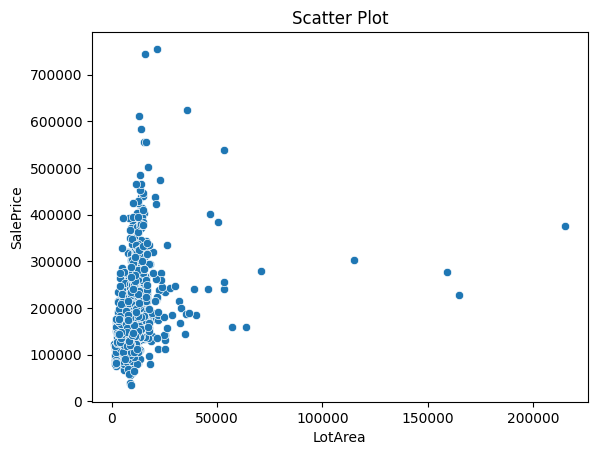

In [135]:
# is there any corr between the size of property and sold price ?

def scatter_plot(df, x_col, y_col):
    sns.scatterplot(x=x_col, y=y_col, data=df)
    plt.title('Scatter Plot')
    
    return plt.show()

scatter_plot(train_data, 'LotArea', 'SalePrice')

In [136]:
px.scatter(train_data, x ='LotArea', y='SalePrice', trendline='ols', trendline_color_override='red', title='Relationship between Lot Area and Sale Price')

In [137]:
train_data['LotArea'].describe()

count      1346.000
mean      10715.473
std       10325.702
min        1300.000
25%        7750.000
50%        9600.000
75%       11760.750
max      215245.000
Name: LotArea, dtype: float64

In [138]:
lot_area_bins = [0, 20000, 40000, 60000, 80000, 100000, 120000, 140000, 160000, 180000, 200000, 220000, 240000]

lot_data = train_data.copy()
lot_data['LotAreaBin'] = pd.cut(lot_data['LotArea'], lot_area_bins)

In [140]:
lot_data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Year_Built,Month_Built,Day_Built,Year_Remodelled,Month_Remodelled,Day_Remodelled,Year_Sold,Month_Sold,Day_Sold,LotAreaBin
0,1,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003-01-01,2003-01-01,Gable,CompShg,VinylSd,VinylSd,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008-01-01,WD,Normal,208500,2003,1,1,2003,1,1,2008,1,1,"(0, 20000]"
1,2,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976-01-01,1976-01-01,Gable,CompShg,MetalSd,MetalSd,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,2007-01-01,WD,Normal,181500,1976,1,1,1976,1,1,2007,1,1,"(0, 20000]"
2,3,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001-01-01,2002-01-01,Gable,CompShg,VinylSd,VinylSd,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,2008-01-01,WD,Normal,223500,2001,1,1,2002,1,1,2008,1,1,"(0, 20000]"
3,4,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915-01-01,1970-01-01,Gable,CompShg,Wd Sdng,Wd Shng,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,2006-01-01,WD,Abnorml,140000,1915,1,1,1970,1,1,2006,1,1,"(0, 20000]"
4,5,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000-01-01,2000-01-01,Gable,CompShg,VinylSd,VinylSd,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008-01-01,WD,Normal,250000,2000,1,1,2000,1,1,2008,1,1,"(0, 20000]"


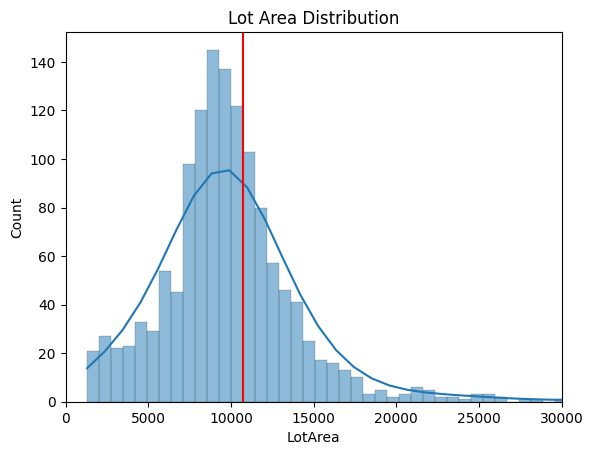

In [142]:
mean_lot_area = train_data['LotArea'].mean()
sns.histplot(train_data['LotArea'], kde=True)
plt.title('Lot Area Distribution')
plt.xlim(0,30000)    
plt.axvline(x=mean_lot_area, color='r', linestyle='-')
plt.show()


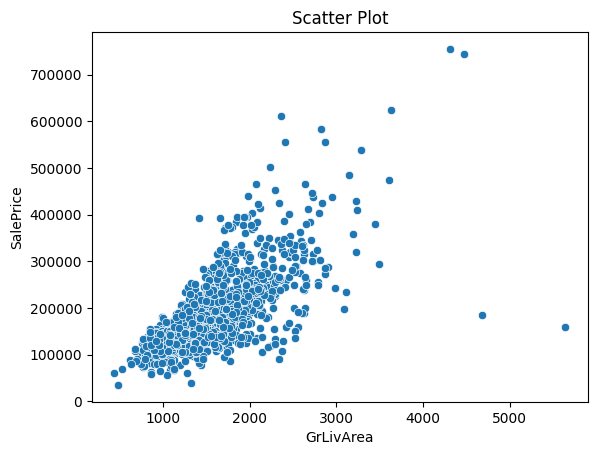

In [143]:
scatter_plot(train_data, 'GrLivArea', 'SalePrice')

In [144]:
px.scatter(train_data, x='GrLivArea', y='SalePrice', trendline='ols', trendline_color_override='red', title='GF Living Area & Property Sale Price')


In [145]:
avg_qual_score = train_data.groupby('OverallQual').SalePrice.mean()
avg_qual_score=avg_qual_score.to_frame().reset_index()
avg_qual_score

,OverallQual,SalePrice
0,2,47655.500
1,3,98009.375
2,4,113702.025
3,5,135481.464
4,6,163321.704
5,7,208004.870
6,8,275599.819
7,9,367513.023
8,10,438588.389


In [146]:
px.scatter(avg_qual_score, x='OverallQual', y='SalePrice', trendline='ols', trendline_color_override='red', title='Relationship betweeen Average Quality Score & Property Sale Price')


In [147]:
# first let's determine the average sale price for each neighbourhood listed 
nhood_avg_price= train_data.groupby('Neighborhood').SalePrice.mean().to_frame().reset_index()
nhood_avg_price=nhood_avg_price.sort_values('SalePrice', ascending=False)
nhood_avg_price

,Neighborhood,SalePrice
15,NoRidge,335295.317
16,NridgHt,316695.237
22,StoneBr,310499.000
23,Timber,244267.649
24,Veenker,238772.727
21,Somerst,225379.837
4,ClearCr,216034.615
6,Crawfor,210624.725
5,CollgCr,199012.014
0,Blmngtn,194870.882


In [149]:
train_data['YrSold'].unique()

<DatetimeArray>
['2008-01-01 00:00:00', '2007-01-01 00:00:00', '2006-01-01 00:00:00',
 '2009-01-01 00:00:00', '2010-01-01 00:00:00']
Length: 5, dtype: datetime64[ns]

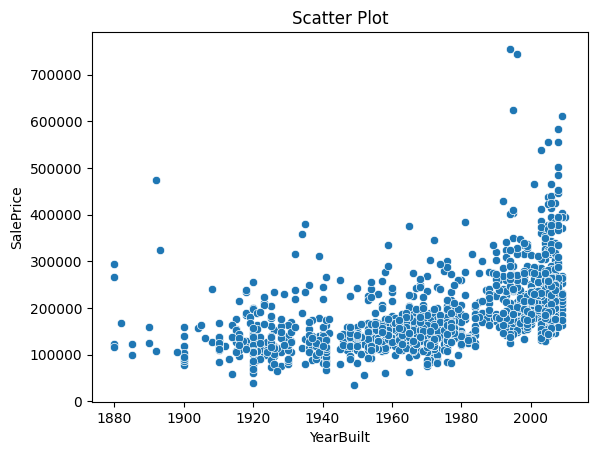

In [150]:
scatter_plot(train_data, 'YearBuilt', 'SalePrice')

In [151]:
px.scatter(train_data, x ='YearBuilt', y='SalePrice', trendline='ols', trendline_color_override='red', title='Relationship between Year property build and Sale Price')


In [152]:
# is there any corr between age of proprty and sold price? 
train_data['PropAge'] = (train_data['YrSold'].dt.year -train_data['YearBuilt'].dt.year)

In [153]:
train_data['PropAge'].describe()

count    1346.000
mean       34.624
std        29.606
min         0.000
25%         7.000
50%        32.000
75%        52.000
max       129.000
Name: PropAge, dtype: float64

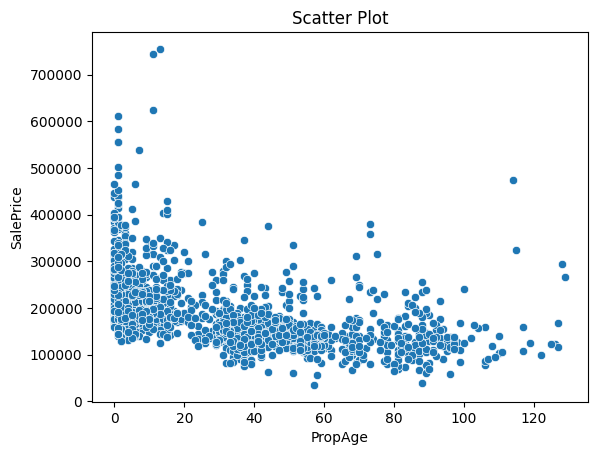

In [154]:
scatter_plot(train_data, 'PropAge', 'SalePrice')

In [155]:
px.scatter(train_data, x ='PropAge', y='SalePrice', trendline='ols', trendline_color_override='red', title='Relationship between Property Age and Sale Price')


There seems to be a negative correlation between property price and sale price. The older the property, the lower the sale price. 

In [161]:
train_data['PropAge'].describe()

count    1346.000
mean       34.624
std        29.606
min         0.000
25%         7.000
50%        32.000
75%        52.000
max       129.000
Name: PropAge, dtype: float64

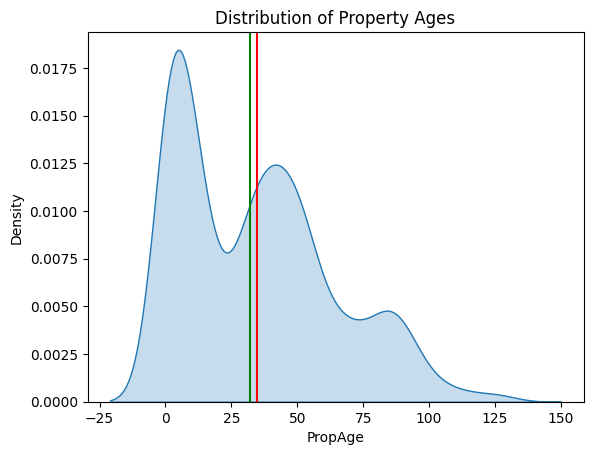

In [160]:
market_age_mean= train_data['PropAge'].mean()
market_age_med= train_data['PropAge'].median()

sns.kdeplot(train_data['PropAge'],fill=True)
plt.axvline(x=market_age_mean, color='r', linestyle='-')
plt.axvline(x=market_age_med, color='g', linestyle='-')
plt.title('Distribution of Property Ages')
plt.show()

Most of the data consists of properties aged between 0 and 25 years. The average property age in the dataset is approx. 34 years.

### Numerical Data Analysis

In [962]:
list(set(train_data.dtypes.tolist()))

[dtype('<M8[ns]'),
 dtype('int32'),
 dtype('int64'),
 dtype('O'),
 dtype('float64')]

In [963]:
num_data.head()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice
0,1,60,65.0,8450,7,5,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,2,208500
1,2,20,80.0,9600,6,8,0.0,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,1976.0,2,460,298,0,0,0,0,0,0,5,181500
2,3,60,68.0,11250,7,5,162.0,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2001.0,2,608,0,42,0,0,0,0,0,9,223500
3,4,70,60.0,9550,7,5,0.0,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,1998.0,3,642,0,35,272,0,0,0,0,2,140000
4,5,60,84.0,14260,8,5,350.0,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,2000.0,3,836,192,84,0,0,0,0,0,12,250000


In [965]:
num_data['SalePrice'].describe()

count      1346.00
mean     187057.31
std       79062.79
min       35311.00
25%      135000.00
50%      169500.00
75%      220000.00
max      755000.00
Name: SalePrice, dtype: float64

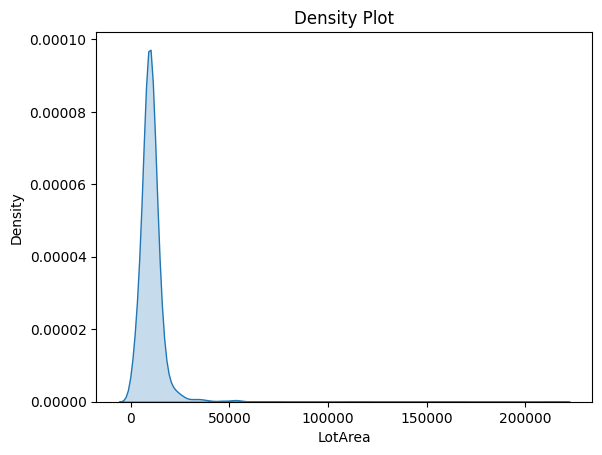

In [966]:
#LotArea
density_plot(num_data, 'LotArea')

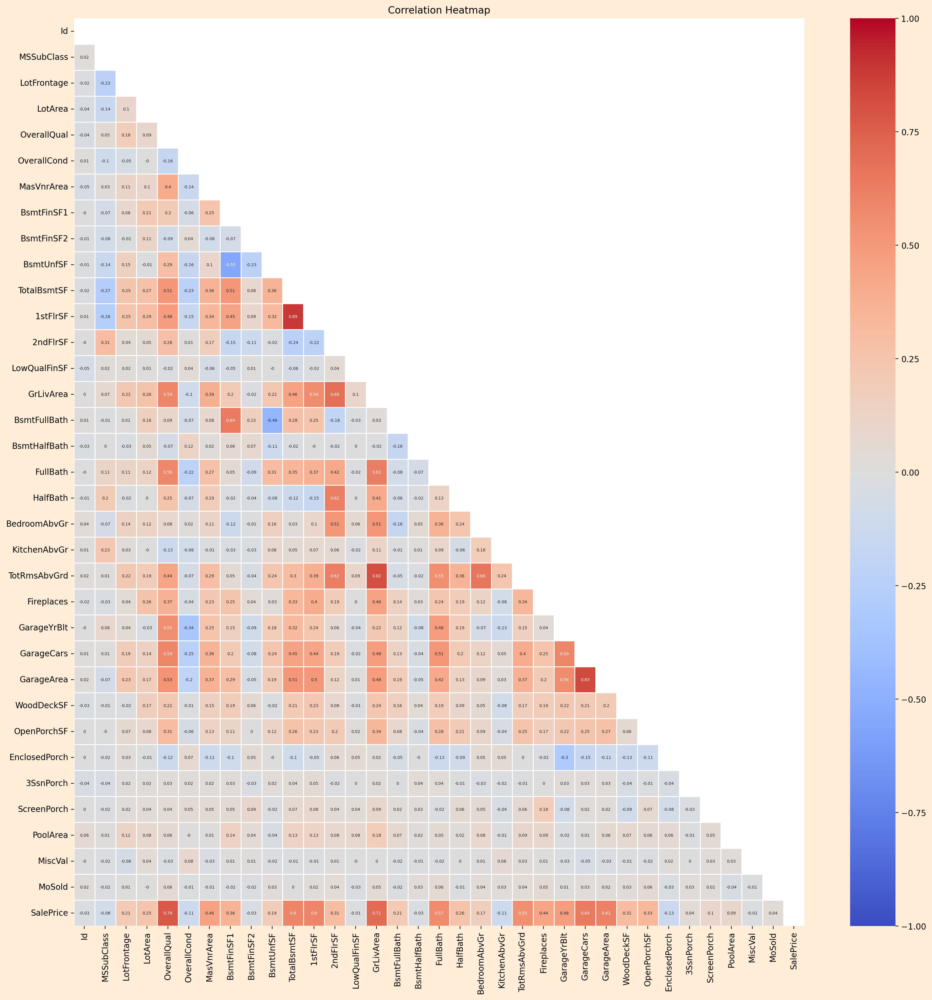

In [967]:
# can we identify any correlations between house sale prices and numeric data? 

fig = plt.figure(figsize=(20,20), facecolor = '#FFEDD8', dpi= 200)
correlation_matrix = num_data.corr().round(2)
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

sns.heatmap(correlation_matrix, vmin=-1, vmax=1, annot=True, annot_kws={"size": 5}, cmap='coolwarm', mask=mask, linewidths=0.5)
plt.title('Correlation Heatmap')

plt.show()

#correlation_heatmap(num_data)


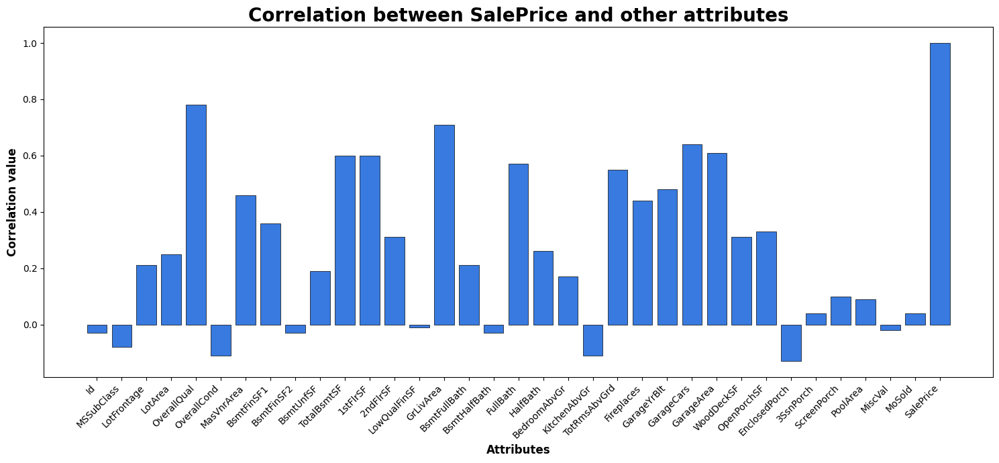

In [968]:
correlation_values = correlation_matrix['SalePrice']
plt.figure(figsize=(15, 7))
plt.bar(correlation_values.index, correlation_values.values, color = '#387ADF', edgecolor = 'black', linewidth = 0.5)

plt.title('Correlation between SalePrice and other attributes', fontsize=20, fontweight = 'bold')
plt.xlabel('Attributes', fontsize=12, fontweight = 'bold')
plt.ylabel('Correlation value', fontsize=12, fontweight = 'bold')
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.tight_layout()
plt.show()

From the above graphs, the following features have a strong influence on sales price:- 
    
    - overall quality 
    - GF area size 
    - FF area size
    - Basement area size
    - Total number of cars which can fit in the garage
    - Garage area size

In [969]:
num_data['OverallQual'].describe()

count    1346.000
mean        6.226
std         1.326
min         2.000
25%         5.000
50%         6.000
75%         7.000
max        10.000
Name: OverallQual, dtype: float64

In [970]:
num_data.head()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice
0,1,60,65.0,8450,7,5,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,2,208500
1,2,20,80.0,9600,6,8,0.0,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,1976.0,2,460,298,0,0,0,0,0,0,5,181500
2,3,60,68.0,11250,7,5,162.0,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2001.0,2,608,0,42,0,0,0,0,0,9,223500
3,4,70,60.0,9550,7,5,0.0,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,1998.0,3,642,0,35,272,0,0,0,0,2,140000
4,5,60,84.0,14260,8,5,350.0,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,2000.0,3,836,192,84,0,0,0,0,0,12,250000


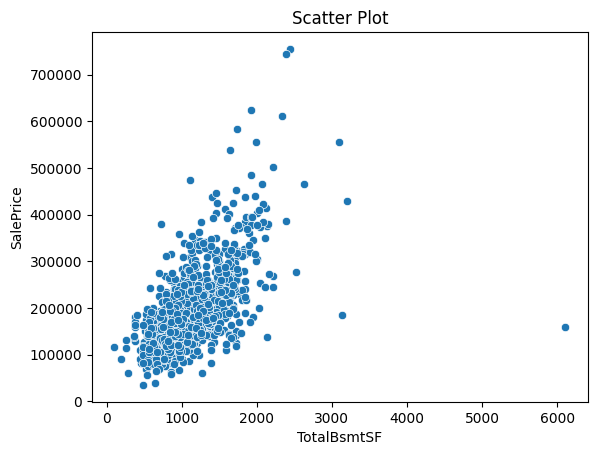

In [971]:
scatter_plot(num_data, 'TotalBsmtSF', 'SalePrice')

In [972]:
avg_bment_sft = num_data.groupby('TotalBsmtSF').SalePrice.mean().to_frame().reset_index()
avg_bment_sft

,TotalBsmtSF,SalePrice
0,105,116000.000
1,190,91300.000
2,264,123500.000
3,290,60000.000
4,360,140000.000
5,372,139000.000
6,384,162066.667
7,408,184100.000
8,440,100175.000
9,458,83000.000


In [973]:
px.scatter(avg_bment_sft, x='TotalBsmtSF', y='SalePrice', trendline='ols', trendline_color_override='red', title='Relationship between Total Basement Areas and Average House Price Sales')


In [974]:
avg_ff_sft = num_data.groupby('1stFlrSF').SalePrice.mean().to_frame().reset_index()
avg_ff_sft

,1stFlrSF,SalePrice
0,438,60000.000
1,480,35311.000
2,483,96628.571
3,520,127763.000
4,525,88000.000
5,526,91000.000
6,536,85000.000
7,546,82166.667
8,551,148800.000
9,561,124000.000


In [975]:
px.scatter(avg_ff_sft, x='1stFlrSF', y='SalePrice', trendline='ols', trendline_color_override='red', title='Relationship between Total First Floor Area and Average House Price Sales')


There is a positive correlation between the FF area and sale prices. 

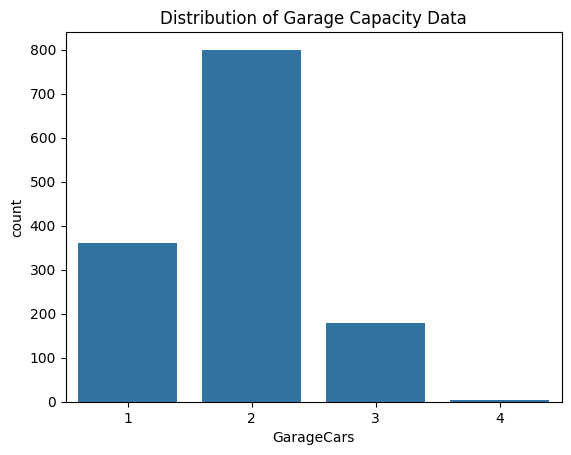

In [976]:
# size of garage in terms of capacity of number of cars 

#density_plot(num_data, 'GarageCars')
sns.countplot(num_data, x='GarageCars')
plt.title('Distribution of Garage Capacity Data')
plt.show()

Most properties have the capacity to park 2 cars in the garage. 

In [977]:
avg_car_capacity = num_data.groupby('GarageCars').SalePrice.mean().to_frame().reset_index()
avg_car_capacity

,GarageCars,SalePrice
0,1,128821.767
1,2,185688.830
2,3,309778.544
3,4,192655.800


In [978]:
px.scatter(avg_car_capacity, x='GarageCars', y='SalePrice', trendline='ols', trendline_color_override='red', title='Relationship between Garage Car Capacity and Average House Price Sales')


In [979]:
avg_garage_area = num_data.groupby('GarageArea').SalePrice.mean().to_frame().reset_index()
avg_garage_area

,GarageArea,SalePrice
0,160,89000.000
1,164,155000.000
2,180,156876.333
3,186,154900.000
4,189,78000.000
5,192,121000.000
6,198,119500.000
7,200,79125.000
8,205,108166.667
9,208,120000.000


In [980]:
px.scatter(avg_garage_area, x='GarageArea', y='SalePrice', trendline='ols', trendline_color_override='red', title='Relationship between Garage Area and Average House Price Sales')


The number of cars which can fit in the garage/the garage area both have a positive impact on sale prices. 

In [981]:
#function to create box plot

def box_plot(df, x_col, y_col):
    sns.boxplot(x=x_col, y=y_col, data=df)
    plt.title('Box Plot')
    
    return plt.show()

In [982]:
train_data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Year_Built,Month_Built,Day_Built,Year_Remodelled,Month_Remodelled,Day_Remodelled,Year_Sold,Month_Sold,Day_Sold,PropAge
0,1,60,RL,65.0,8450,Pave,Not_applicable,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003-01-01,2003-01-01,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,Not_applicable,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,Not_applicable,Not_applicable,Not_applicable,0,2,2008-01-01,WD,Normal,208500,2003,1,1,2003,1,1,2008,1,1,5
1,2,20,RL,80.0,9600,Pave,Not_applicable,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976-01-01,1976-01-01,Gable,CompShg,MetalSd,MetalSd,Not_applicable,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,Not_applicable,Not_applicable,Not_applicable,0,5,2007-01-01,WD,Normal,181500,1976,1,1,1976,1,1,2007,1,1,31
2,3,60,RL,68.0,11250,Pave,Not_applicable,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001-01-01,2002-01-01,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,Not_applicable,Not_applicable,Not_applicable,0,9,2008-01-01,WD,Normal,223500,2001,1,1,2002,1,1,2008,1,1,7
3,4,70,RL,60.0,9550,Pave,Not_applicable,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915-01-01,1970-01-01,Gable,CompShg,Wd Sdng,Wd Shng,Not_applicable,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,Not_applicable,Not_applicable,Not_applicable,0,2,2006-01-01,WD,Abnorml,140000,1915,1,1,1970,1,1,2006,1,1,91
4,5,60,RL,84.0,14260,Pave,Not_applicable,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000-01-01,2000-01-01,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,Not_applicable,Not_applicable,Not_applicable,0,12,2008-01-01,WD,Normal,250000,2000,1,1,2000,1,1,2008,1,1,8


In [983]:
train_data['YrSold'].value_counts()

YrSold
2009-01-01    309
2007-01-01    308
2006-01-01    292
2008-01-01    276
2010-01-01    161
Name: count, dtype: int64

In [984]:
#avg sales price per yr
avg_annual_sales = train_data.groupby('YrSold').SalePrice.mean()

In [985]:
avg_annual_sales = avg_annual_sales.to_frame().reset_index()

In [986]:
px.scatter(avg_annual_sales, x='YrSold', y='SalePrice', trendline='ols', trendline_color_override='red', title='Annual Average House Price Sales')


There appears to be a downward trend in property prices since 2006.

In [987]:
#avg sales price per month

avg_monthly_sales = train_data.groupby('MoSold').SalePrice.mean()
avg_monthly_sales = avg_monthly_sales.to_frame().reset_index()
px.scatter(avg_monthly_sales, x ='MoSold', y='SalePrice', trendline='ols', trendline_color_override='red', title='Monthly Average House Price Sales')


Mid to end of the year seems to be the optimal time to achieve higher sale price. 

In [988]:
train_data['YrSold'].unique()

<DatetimeArray>
['2008-01-01 00:00:00', '2007-01-01 00:00:00', '2006-01-01 00:00:00',
 '2009-01-01 00:00:00', '2010-01-01 00:00:00']
Length: 5, dtype: datetime64[ns]

In [989]:
train_data['Year_Sold'] = train_data['YrSold'].dt.year
train_data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Year_Built,Month_Built,Day_Built,Year_Remodelled,Month_Remodelled,Day_Remodelled,Year_Sold,Month_Sold,Day_Sold,PropAge
0,1,60,RL,65.0,8450,Pave,Not_applicable,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003-01-01,2003-01-01,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,Not_applicable,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,Not_applicable,Not_applicable,Not_applicable,0,2,2008-01-01,WD,Normal,208500,2003,1,1,2003,1,1,2008,1,1,5
1,2,20,RL,80.0,9600,Pave,Not_applicable,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976-01-01,1976-01-01,Gable,CompShg,MetalSd,MetalSd,Not_applicable,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,Not_applicable,Not_applicable,Not_applicable,0,5,2007-01-01,WD,Normal,181500,1976,1,1,1976,1,1,2007,1,1,31
2,3,60,RL,68.0,11250,Pave,Not_applicable,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001-01-01,2002-01-01,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,Not_applicable,Not_applicable,Not_applicable,0,9,2008-01-01,WD,Normal,223500,2001,1,1,2002,1,1,2008,1,1,7
3,4,70,RL,60.0,9550,Pave,Not_applicable,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915-01-01,1970-01-01,Gable,CompShg,Wd Sdng,Wd Shng,Not_applicable,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,Not_applicable,Not_applicable,Not_applicable,0,2,2006-01-01,WD,Abnorml,140000,1915,1,1,1970,1,1,2006,1,1,91
4,5,60,RL,84.0,14260,Pave,Not_applicable,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000-01-01,2000-01-01,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,Not_applicable,Not_applicable,Not_applicable,0,12,2008-01-01,WD,Normal,250000,2000,1,1,2000,1,1,2008,1,1,8


In [990]:
#let's take a closer look at year sold and month sold 
sales_df = train_data.pivot_table(index='Year_Sold', columns ='MoSold', values='SalePrice', aggfunc='mean')
row_order = [2006, 2007, 2008, 2009, 2010]
sales_df = sales_df.reindex(row_order)

In [991]:
sales_df

MoSold,1,2,3,4,5,6,7,8,9,10,11,12
Year_Sold,,,,,,,,,,,,
2006,201090.000,194550.000,190502.292,184247.750,162907.857,179218.182,189463.565,206477.095,223768.867,178139.136,213285.000,190140.000
2007,195229.167,176301.750,180618.895,173844.091,173342.951,182400.404,200661.229,190515.083,205737.200,220190.733,197709.333,226747.562
2008,196187.364,159370.000,186730.938,166244.652,194134.571,174276.625,186240.419,199285.071,195445.833,166690.636,216042.375,186616.667
2009,213282.600,187450.000,181712.500,185028.000,171852.029,193688.627,203379.807,168576.036,200051.947,174463.120,164525.000,169837.000
2010,167730.667,178989.286,203181.286,181439.909,186778.818,184072.143,135100.000,NaN,NaN,NaN,NaN,NaN


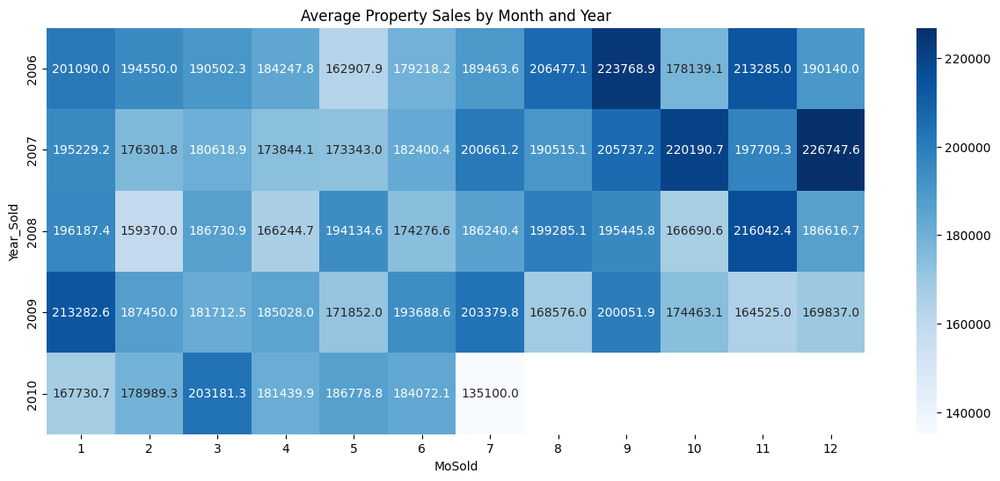

In [992]:
plt.figure(figsize=(15,6))
sns.heatmap(sales_df, cmap='Blues', annot=True, fmt='.1f')
plt.title('Average Property Sales by Month and Year')
plt.show()

In [993]:
#number of beds and sale prices
avg_bed_nums = train_data.groupby('BedroomAbvGr').SalePrice.mean().to_frame().reset_index()
px.scatter(avg_bed_nums, x ='BedroomAbvGr', y='SalePrice', trendline='ols', trendline_color_override='red', title='Relationship between Number of Bedrooms Above Grade (excl. basement) and Average Sale Price')

### Categorical Data Analysis

Text(0.5, 1.0, 'Property Sale Price by Building Type')

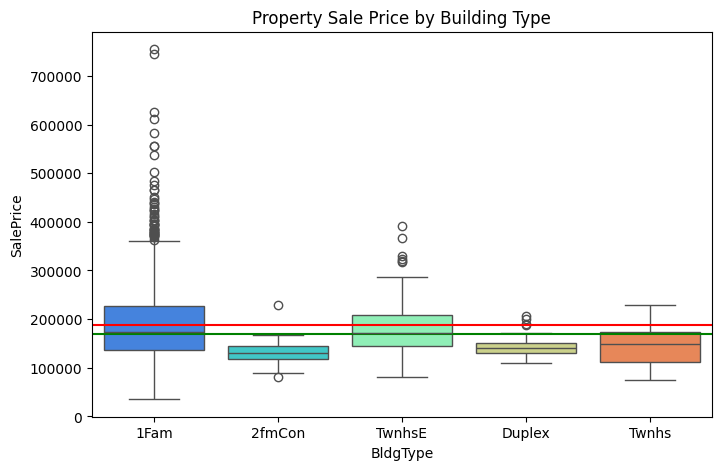

In [1003]:
# sale price by bdg type 

plt.figure(figsize=(8,5))
sns.boxplot(x='BldgType', y='SalePrice', data=train_data, palette='rainbow', hue='BldgType', legend=False)
plt.axhline(y=market_value_mean, color='r', linestyle='-')
plt.axhline(y=market_value_med, color='g', linestyle='-')
plt.title('Property Sale Price by Building Type')

Text(0.5, 1.0, 'Sale Price by Building Type, Divided by Sale Type')

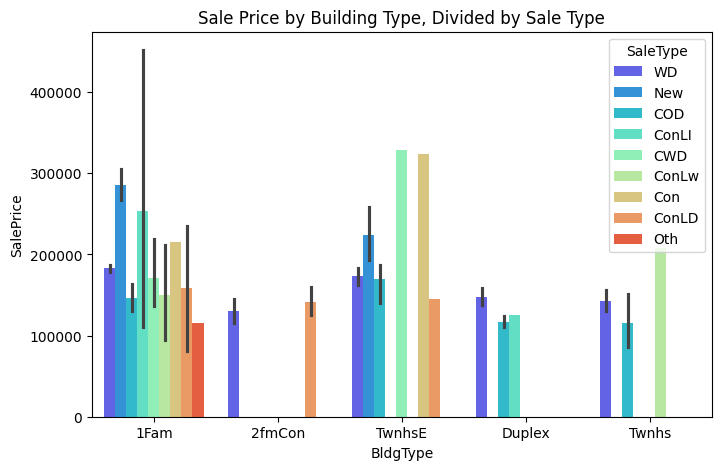

In [1004]:
# sale type in relation to bdg type

plt.figure(figsize=(8,5))
sns.barplot(x='BldgType',y='SalePrice',data=train_data, palette='rainbow', hue='SaleType')
plt.title("Sale Price by Building Type, Divided by Sale Type")

<Axes: xlabel='BldgType', ylabel='count'>

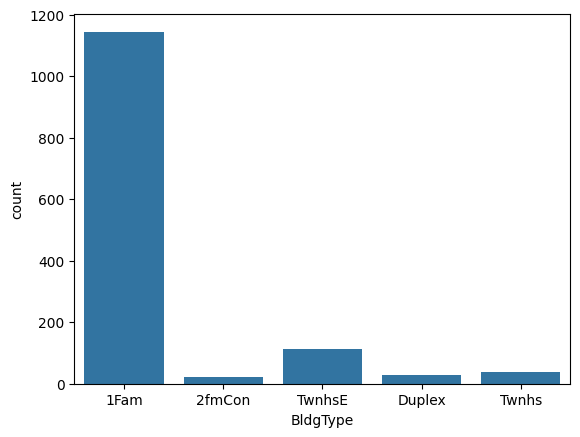

In [1005]:
sns.countplot(x='BldgType',data=train_data)


Text(0.5, 1.0, 'Property Sale Price by Exterior Condition')

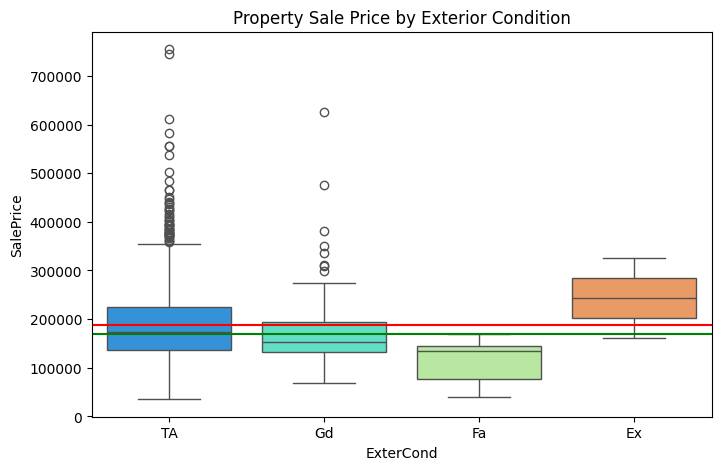

In [1006]:
# sale price by exterior condition

plt.figure(figsize=(8,5))
sns.boxplot(x='ExterCond', y='SalePrice', data=train_data, palette='rainbow', hue='ExterCond', legend=False)
plt.axhline(y=market_value_mean, color='r', linestyle='-')
plt.axhline(y=market_value_med, color='g', linestyle='-')
plt.title('Property Sale Price by Exterior Condition')

Text(0.5, 1.0, 'Sale Price by Neighborhood, Divided by Year Sold')

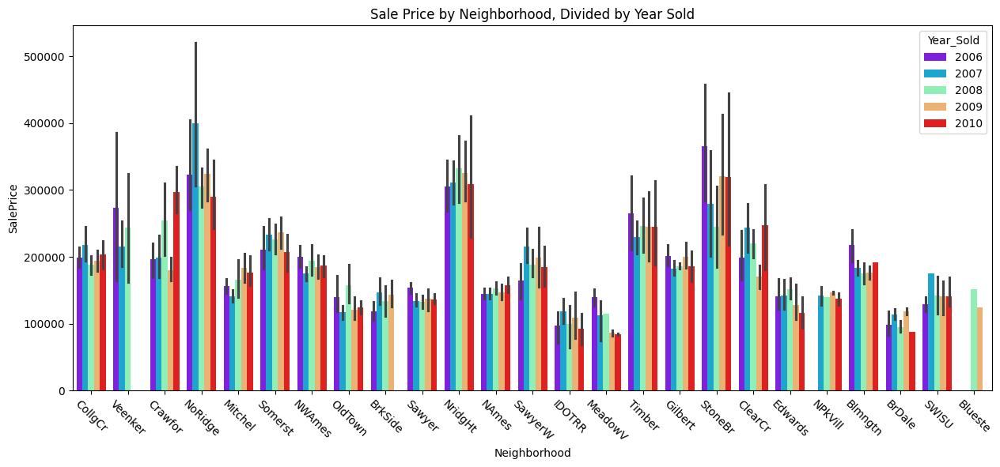

In [1007]:
# sale price by neighborhood and yr
plt.figure(figsize=(15,6))
sns.barplot(x='Neighborhood',y='SalePrice',data=train_data, palette='rainbow', hue='Year_Sold')
plt.xticks(rotation=-45)
plt.title("Sale Price by Neighborhood, Divided by Year Sold")

Text(0.5, 1.0, 'Property Sale Price in relation to Proximity to Rail or Road links')

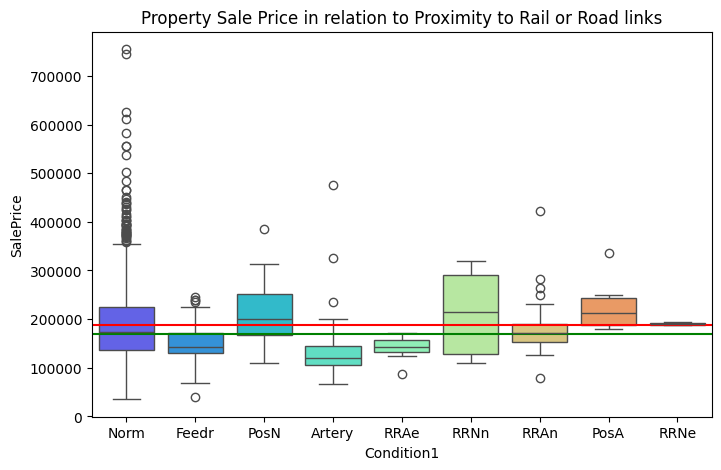

In [1008]:
# proximity to rail or road and price 
plt.figure(figsize=(8,5))
sns.boxplot(x='Condition1', y='SalePrice', data=train_data, palette='rainbow', hue='Condition1', legend=False)
plt.axhline(y=market_value_mean, color='r', linestyle='-')
plt.axhline(y=market_value_med, color='g', linestyle='-')
plt.title('Property Sale Price in relation to Proximity to Rail or Road links')

Proximity to rail or road :- 

- Artery:	Adjacent to arterial street
- Feedr:	Adjacent to feeder street	
- Norm:	Normal	
- RRNn:	Within 200' of North-South Railroad
- RRAn:	Adjacent to North-South Railroad
- PosN:	Near positive off-site feature--park, greenbelt, etc.
- PosA:	Adjacent to postive off-site feature
- RRNe:	Within 200' of East-West Railroad
- RRAe:	Adjacent to East-West Railroad

The above box plots suggest:- 
    
1. Very few properties are within 200' of East-West Railroad
2. Higher sale prices are achieved for properties located in the following locations:-
    - Near positive off-site feature--park, greenbelt, etc.
    - Within 200' of North-South Railroad
    - Adjacent to postive off-site feature
3. Properties located in the following locations achieved a lower sale price:- 
- Adjacent to feeder street
- Adjacent to arterial street
- Adjacent to East-West Railroad

<Axes: xlabel='Condition1', ylabel='count'>

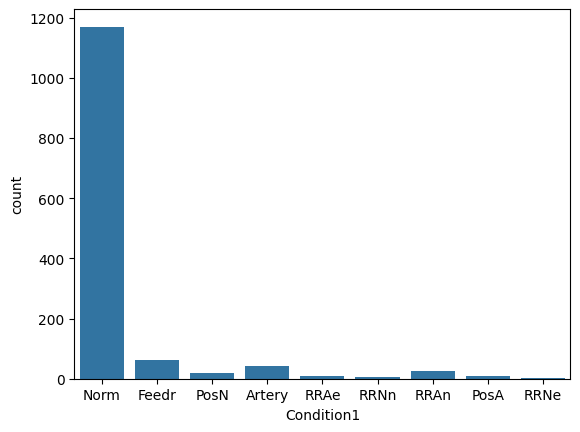

In [1009]:
sns.countplot(x='Condition1',data=train_data)


Text(0, 0.5, 'SalePrice')

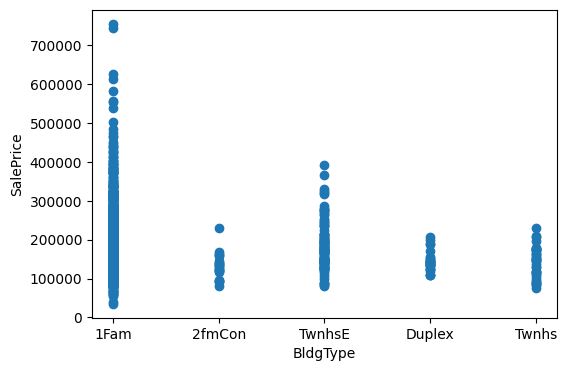

In [1010]:
plt.figure(figsize=(6,4))
plt.scatter(x='BldgType',y='SalePrice',data=train_data)
plt.xlabel('BldgType')
plt.ylabel('SalePrice')

Text(0, 0.5, 'SalePrice')

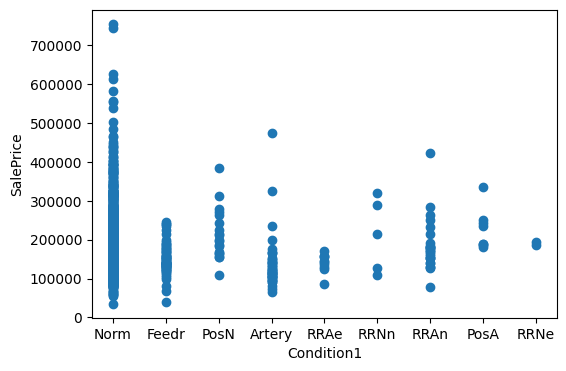

In [1011]:
plt.figure(figsize=(6,4))
plt.scatter(x='Condition1',y='SalePrice',data=train_data)
plt.xlabel('Condition1')
plt.ylabel('SalePrice')

#### Encode Categorical Data

In [86]:
from sklearn.preprocessing import OneHotEncoder

categorical_cols = train_data.select_dtypes(['object']).columns.tolist()

encoder = OneHotEncoder(sparse_output=False)

one_hot_encoded = encoder.fit_transform(train_data[categorical_cols])

one_hot_df = pd.DataFrame(one_hot_encoded, columns=encoder.get_feature_names_out(categorical_cols))

df_encoded = pd.concat([train_data, one_hot_df], axis=1)

train_data = df_encoded.drop(categorical_cols, axis=1)

train_data.head()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,Year_Built,Month_Built,Day_Built,Year_Remodelled,Month_Remodelled,Day_Remodelled,Year_Sold,Month_Sold,Day_Sold,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_AllPub,Utilities_NoSeWa,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Gtl,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Artery,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Flat,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_ClyTile,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsbShng,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsbShng,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,ExterQual_Ex,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Ex,ExterCond_Fa,ExterCond_Gd,ExterCond_TA,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Stone,Foundation_Wood,BsmtQual_Ex,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtCond_Fa,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Av,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_ALQ,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_ALQ,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,HeatingQC_Ex,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_N,CentralAir_Y,Electrical_FuseA,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Ex,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj1,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,GarageType_2Types,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageFinish_Fin,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Ex,GarageQual_Fa,GarageQual_Gd,GarageQual_Po,GarageQual_TA,GarageCond_Ex,GarageCond_Fa,GarageCond_Gd,GarageCond_Po,GarageCond_TA,PavedDrive_N,PavedDrive_P,PavedDrive_Y,Sa

In [87]:
train_data.shape

(1453, 272)

### Model Selection 

Given that we are trying to predict future property sale prices, this is a regression problem. 

Regression is  a supervised learning type of problem. There are various types of regression models we could consider, to name a few:- 

1. Linear regression: Assumes a linear relationship between the input features and the target variable. 
2. Decision Tree Regression: Builds a decision tree to recursively partition the feature space into smaller regions.
3. Random Forest Regression: An ensemble learning method that combines multiple decision trees. Provides better generalisation performance compared to a single decision tree.
4. Gradient Boosting Regression: Another ensemble learning method where trees are built sequentially, with each tree correcting the errors of the previous ones. (e.g. XGBoost, LightBGM) 

Let's begin with a simple model, Linear Regression.

The steps to building and using a model are:

Define: What type of model will it be? A decision tree? Some other type of model? Some other parameters of the model type are specified too.
Fit: Capture patterns from provided data. This is the heart of modeling.
Predict: Just what it sounds like
Evaluate: Determine how accurate the model's predictions are.

### 🎯 Feature Selection using Random Forest Regression



#### Prepare training data for modelling 

In [1012]:
train_data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Year_Built,Month_Built,Day_Built,Year_Remodelled,Month_Remodelled,Day_Remodelled,Year_Sold,Month_Sold,Day_Sold,PropAge
0,1,60,RL,65.0,8450,Pave,Not_applicable,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003-01-01,2003-01-01,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,Not_applicable,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,Not_applicable,Not_applicable,Not_applicable,0,2,2008-01-01,WD,Normal,208500,2003,1,1,2003,1,1,2008,1,1,5
1,2,20,RL,80.0,9600,Pave,Not_applicable,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976-01-01,1976-01-01,Gable,CompShg,MetalSd,MetalSd,Not_applicable,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,Not_applicable,Not_applicable,Not_applicable,0,5,2007-01-01,WD,Normal,181500,1976,1,1,1976,1,1,2007,1,1,31
2,3,60,RL,68.0,11250,Pave,Not_applicable,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001-01-01,2002-01-01,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,Not_applicable,Not_applicable,Not_applicable,0,9,2008-01-01,WD,Normal,223500,2001,1,1,2002,1,1,2008,1,1,7
3,4,70,RL,60.0,9550,Pave,Not_applicable,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915-01-01,1970-01-01,Gable,CompShg,Wd Sdng,Wd Shng,Not_applicable,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,Not_applicable,Not_applicable,Not_applicable,0,2,2006-01-01,WD,Abnorml,140000,1915,1,1,1970,1,1,2006,1,1,91
4,5,60,RL,84.0,14260,Pave,Not_applicable,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000-01-01,2000-01-01,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,Not_applicable,Not_applicable,Not_applicable,0,12,2008-01-01,WD,Normal,250000,2000,1,1,2000,1,1,2008,1,1,8


In [1013]:
cat_data = train_data.select_dtypes(include = ['object'])
cat_data.columns

Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition'],
      dtype='object')

In [1014]:
df2 = train_data.drop(columns=['SalePrice'])
y = train_data['SalePrice']

In [1015]:
df2.dtypes

Id                           int64
MSSubClass                   int64
MSZoning                    object
LotFrontage                float64
LotArea                      int64
Street                      object
Alley                       object
LotShape                    object
LandContour                 object
Utilities                   object
LotConfig                   object
LandSlope                   object
Neighborhood                object
Condition1                  object
Condition2                  object
BldgType                    object
HouseStyle                  object
OverallQual                  int64
OverallCond                  int64
YearBuilt           datetime64[ns]
YearRemodAdd        datetime64[ns]
RoofStyle                   object
RoofMatl                    object
Exterior1st                 object
Exterior2nd                 object
MasVnrType                  object
MasVnrArea                 float64
ExterQual                   object
ExterCond           

In [1016]:
#encode categorical data 

X = pd.get_dummies(df2, columns =['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition'], drop_first=False, dtype='float')


In [1017]:
X.head()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,Year_Built,Month_Built,Day_Built,Year_Remodelled,Month_Remodelled,Day_Remodelled,Year_Sold,Month_Sold,Day_Sold,PropAge,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_Grvl,Alley_Not_applicable,Alley_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_AllPub,Utilities_NoSeWa,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Gtl,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Artery,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Flat,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_ClyTile,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsbShng,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsbShng,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_Not_applicable,MasVnrType_Stone,ExterQual_Ex,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Ex,ExterCond_Fa,ExterCond_Gd,ExterCond_TA,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Stone,Foundation_Wood,BsmtQual_Ex,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtCond_Fa,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Av,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_ALQ,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_ALQ,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,HeatingQC_Ex,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_N,CentralAir_Y,Electrical_FuseA,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Ex,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj1,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Ex,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_Not_applicable,FireplaceQu_Po,FireplaceQu_TA,GarageType_2Types,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageFin

In [1018]:
X = X.drop(columns=['YearBuilt', 'YrSold', 'YearRemodAdd'], axis=1)

In [1019]:
y.head()

0    208500
1    181500
2    223500
3    140000
4    250000
Name: SalePrice, dtype: int64

In [1020]:
X.isna().sum()

Id                            0
MSSubClass                    0
LotFrontage                   0
LotArea                       0
OverallQual                   0
OverallCond                   0
MasVnrArea                    0
BsmtFinSF1                    0
BsmtFinSF2                    0
BsmtUnfSF                     0
TotalBsmtSF                   0
1stFlrSF                      0
2ndFlrSF                      0
LowQualFinSF                  0
GrLivArea                     0
BsmtFullBath                  0
BsmtHalfBath                  0
FullBath                      0
HalfBath                      0
BedroomAbvGr                  0
KitchenAbvGr                  0
TotRmsAbvGrd                  0
Fireplaces                    0
GarageYrBlt                   0
GarageCars                    0
GarageArea                    0
WoodDeckSF                    0
OpenPorchSF                   0
EnclosedPorch                 0
3SsnPorch                     0
ScreenPorch                   0
PoolArea

In [1021]:
y.isna().sum()

0

In [1022]:
x_cols_lst=list(X.columns)
x_cols_lst

['Id',
 'MSSubClass',
 'LotFrontage',
 'LotArea',
 'OverallQual',
 'OverallCond',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageYrBlt',
 'GarageCars',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal',
 'MoSold',
 'Year_Built',
 'Month_Built',
 'Day_Built',
 'Year_Remodelled',
 'Month_Remodelled',
 'Day_Remodelled',
 'Year_Sold',
 'Month_Sold',
 'Day_Sold',
 'PropAge',
 'MSZoning_C (all)',
 'MSZoning_FV',
 'MSZoning_RH',
 'MSZoning_RL',
 'MSZoning_RM',
 'Street_Grvl',
 'Street_Pave',
 'Alley_Grvl',
 'Alley_Not_applicable',
 'Alley_Pave',
 'LotShape_IR1',
 'LotShape_IR2',
 'LotShape_IR3',
 'LotShape_Reg',
 'LandContour_Bnk',
 'LandContour_HLS',
 'LandContour_Low',
 'LandContour_Lvl',
 'Utilities_AllPub',

In [1023]:
# train model - random forest regression 
#import libraries 

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_log_error
from sklearn.model_selection import cross_val_score
from sklearn.feature_selection import SelectKBest
from sklearn.ensemble import RandomForestRegressor

#split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.33, random_state=42)
#define model
regressor = RandomForestRegressor(n_estimators=100, random_state=42)
#fit model 
regressor.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [1024]:
# Get the feature importances from the trained model
importances = regressor.feature_importances_

# Create a DataFrame for better visualization
feature_importances = pd.DataFrame({'Feature': X_train.columns, 'Importance': importances})

# Sort features by importance
feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

In [1025]:
feature_importances


,Feature,Importance
4,OverallQual,5.231e-01
14,GrLivArea,1.334e-01
10,TotalBsmtSF,4.135e-02
17,FullBath,3.728e-02
7,BsmtFinSF1,3.044e-02
11,1stFlrSF,2.315e-02
21,TotRmsAbvGrd,2.312e-02
3,LotArea,1.408e-02
12,2ndFlrSF,1.180e-02
25,GarageArea,1.019e-02


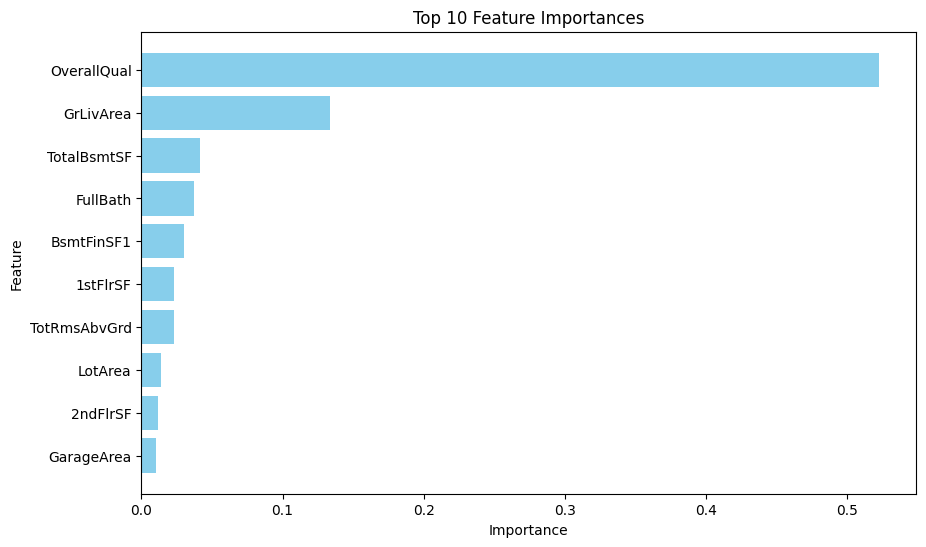

In [1026]:
# Plot the top 10 most important features
plt.figure(figsize=(10, 6))
plt.barh(feature_importances['Feature'][:10], feature_importances['Importance'][:10], color='skyblue')
plt.gca().invert_yaxis()  # To have the most important feature at the top
plt.title('Top 10 Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

From the above feature selection exercise, we can determine the top 10 features to include in our ML model:- 
    
1. Overall Quality
2. GF living area
3. Total basement sq.ft  
4. Number of full bathrooms 2nd floor sq.ft
5. Basement Type 1 finished sq.ft
6. 1st Floor sq.ft
7. Total Number of rooms GF 
8. Lot Area
9. 2nd Floor sq.ft
10. Garage Area


In [1027]:
feature_importances[:20]

,Feature,Importance
4,OverallQual,0.523
14,GrLivArea,0.133
10,TotalBsmtSF,0.041
17,FullBath,0.037
7,BsmtFinSF1,0.030
11,1stFlrSF,0.023
21,TotRmsAbvGrd,0.023
3,LotArea,0.014
12,2ndFlrSF,0.012
25,GarageArea,0.010


From our EDA the following features are worth including in our model: - 

- Lot Area
- GF living area
- Total Basement Sq/ft
- First Floor Sq/ft
- Garage Car capacity
- Garage Area
- Year Built
- Month sold
- Year sold 
- Overall Quality score
- Property age 
- Number of bedrooms above grade (excl. basement)
- Neighborhood
- Condition1 (proximity to rail or road)

There is some overlap between our feature selection exercise and EDA findings. 

### Feature Selection using Linear Regression Model 

In [1028]:
#import libraries 

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_log_error
from sklearn.model_selection import cross_val_score
from sklearn.feature_selection import SelectKBest


In [1029]:
X.head()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,Year_Built,Month_Built,Day_Built,Year_Remodelled,Month_Remodelled,Day_Remodelled,Year_Sold,Month_Sold,Day_Sold,PropAge,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_Grvl,Alley_Not_applicable,Alley_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_AllPub,Utilities_NoSeWa,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Gtl,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Artery,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Flat,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_ClyTile,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsbShng,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsbShng,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_Not_applicable,MasVnrType_Stone,ExterQual_Ex,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Ex,ExterCond_Fa,ExterCond_Gd,ExterCond_TA,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Stone,Foundation_Wood,BsmtQual_Ex,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtCond_Fa,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Av,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_ALQ,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_ALQ,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,HeatingQC_Ex,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_N,CentralAir_Y,Electrical_FuseA,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Ex,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj1,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Ex,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_Not_applicable,FireplaceQu_Po,FireplaceQu_TA,GarageType_2Types,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageFinish_Fin,GarageFinish_RFn,Garag

In [1030]:
y.head()

0    208500
1    181500
2    223500
3    140000
4    250000
Name: SalePrice, dtype: int64

In [1031]:
from sklearn.linear_model import LinearRegression

#split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.33, random_state=42)

In [1032]:
#train and fit LR model 
model = LinearRegression(fit_intercept=False).fit(X_train, y_train)

In [1033]:
coeffs = model.coef_

coef_df = pd.DataFrame({'Feature': X.columns, 'Coefficient': coeffs})

lr_feature_importances = coef_df.sort_values(by='Coefficient', ascending=False)

In [1085]:
print(len(lr_feature_importances))

296


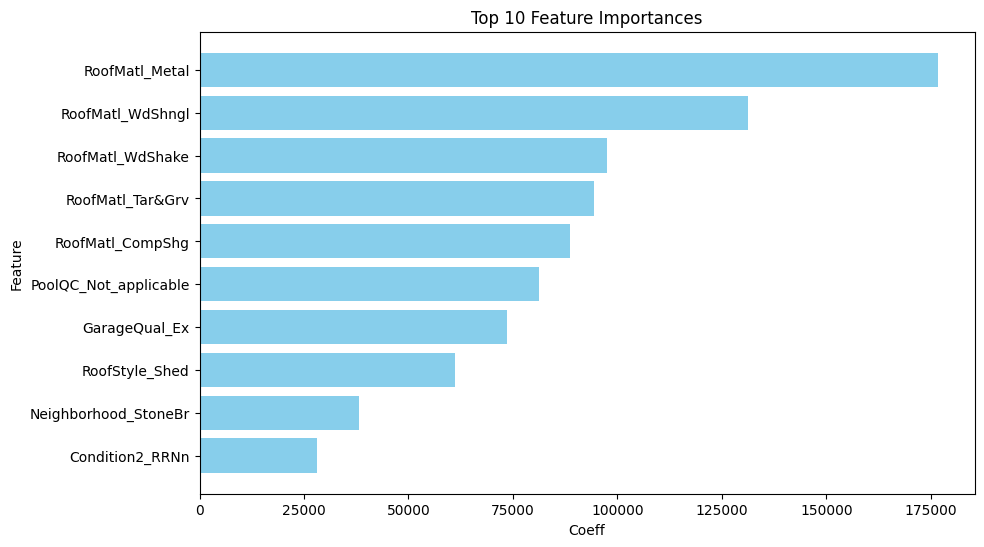

In [1037]:
# Plot the top 10 most important features
plt.figure(figsize=(10, 6))
plt.barh(lr_feature_importances['Feature'][:10], lr_feature_importances['Coefficient'][:10], color='skyblue')
plt.gca().invert_yaxis()  # To have the most important feature at the top
plt.title('Top 10 Feature Importances')
plt.xlabel('Coeff')
plt.ylabel('Feature')
plt.show()

From our feature selection findings we can see that the roof material type has a big impact on property prices. For example, the property price changes by $175k with a unit change in metal roof. 

In [1041]:
lr_feature_importances.loc[lr_feature_importances['Coefficient']>0].sort_values(by='Coefficient', ascending=False).reset_index()

,index,Feature,Coefficient
0,136,RoofMatl_Metal,1.766e+05
1,140,RoofMatl_WdShngl,1.312e+05
2,139,RoofMatl_WdShake,9.748e+04
3,138,RoofMatl_Tar&Grv,9.428e+04
4,134,RoofMatl_CompShg,8.875e+04
5,270,PoolQC_Not_applicable,8.114e+04
6,254,GarageQual_Ex,7.349e+04
7,132,RoofStyle_Shed,6.104e+04
8,94,Neighborhood_StoneBr,3.804e+04
9,113,Condition2_RRNn,2.817e+04


### Linear Regression Model

In [1042]:
X.head()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,Year_Built,Month_Built,Day_Built,Year_Remodelled,Month_Remodelled,Day_Remodelled,Year_Sold,Month_Sold,Day_Sold,PropAge,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_Grvl,Alley_Not_applicable,Alley_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_AllPub,Utilities_NoSeWa,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Gtl,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Artery,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Flat,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_ClyTile,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsbShng,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsbShng,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_Not_applicable,MasVnrType_Stone,ExterQual_Ex,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Ex,ExterCond_Fa,ExterCond_Gd,ExterCond_TA,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Stone,Foundation_Wood,BsmtQual_Ex,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtCond_Fa,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Av,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_ALQ,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_ALQ,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,HeatingQC_Ex,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_N,CentralAir_Y,Electrical_FuseA,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Ex,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj1,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Ex,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_Not_applicable,FireplaceQu_Po,FireplaceQu_TA,GarageType_2Types,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageFinish_Fin,GarageFinish_RFn,Garag

In [1043]:
y.head()

0    208500
1    181500
2    223500
3    140000
4    250000
Name: SalePrice, dtype: int64

In [1044]:
from sklearn.linear_model import LinearRegression

#split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.33, random_state=42)

model = LinearRegression(fit_intercept=False).fit(X_train, y_train)

#make predictions 
y_pred = model.predict(X_test)

In [1045]:
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.metrics import mean_absolute_error

# Evaluating the model

# MSE
mse = mean_squared_error(y_test, y_pred)
print(f'Test Linear Regression MSE: {mse}')

# RMSLE
rmsle_test = mean_squared_log_error(y_test, y_pred)** 0.5
print(f'Test Linear Regression RMSLE: {rmsle_test: 5f}')

#R2
r2 = r2_score(y_test, y_pred)
print(f'Test Linear Regression R-squared: {r2}')

# MAE
mae = mean_absolute_error(y_test, y_pred)
print(f'Test Linear Regression MAE: {mae}')


Test Linear Regression MSE: 1185706183.1584158
Test Linear Regression RMSLE:  0.174646
Test Linear Regression R-squared: 0.7812037653015356
Test Linear Regression MAE: 18797.04770614178


## 🧪 Linear Regression Model Evaluation


- Mean Squared Error (MSE) - measures how well a regression model predicts the actual values. It takes the average of the squared differences between predicted values and actual values. The lower the MSE, the closer the predictions are to the actual values. 


- Root Mean Squared Log Error (RMSLE) - measures the error between the predicted and actual values, but takes the log of the predictions and actual values before calculating the error. More suited to calculating relative differences (e.g. predicting sales numbers where some values can be significantly larger than others). 


- R-squared - measures the goodness-of-fit. It shows explains how much of the target variable's variance is captured by the model (higher is better). 


- Mean Absolute Error (MAE) - measures the averafe of the absolute differences between the predicted and actual values. 


The MAE value gives us a clear and simple evaluation of the model, since it offers a direct measure of $ to $. The test data has a RMSLE of 0.17 and a MAE of $18,797 which indicates good performance by the Linear Regression Model.



#### Linear Regression Model with Select Features

In [1046]:
X.head()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,Year_Built,Month_Built,Day_Built,Year_Remodelled,Month_Remodelled,Day_Remodelled,Year_Sold,Month_Sold,Day_Sold,PropAge,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_Grvl,Alley_Not_applicable,Alley_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_AllPub,Utilities_NoSeWa,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Gtl,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Artery,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Flat,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_ClyTile,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsbShng,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsbShng,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_Not_applicable,MasVnrType_Stone,ExterQual_Ex,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Ex,ExterCond_Fa,ExterCond_Gd,ExterCond_TA,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Stone,Foundation_Wood,BsmtQual_Ex,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtCond_Fa,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Av,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_ALQ,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_ALQ,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,HeatingQC_Ex,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_N,CentralAir_Y,Electrical_FuseA,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Ex,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj1,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Ex,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_Not_applicable,FireplaceQu_Po,FireplaceQu_TA,GarageType_2Types,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageFinish_Fin,GarageFinish_RFn,Garag

In [1092]:
top_k = 100
top_lr_features = lr_feature_importances['Feature'][:top_k].values

X_train_selected =  X_train[top_lr_features]
X_test_selected = X_test[top_lr_features]

#re-train the lr model with only the top k features
lr_selected = LinearRegression(fit_intercept=False).fit(X_train_selected, y_train)

In [1093]:
y_pred_selected = lr_selected.predict(X_test_selected)
y_pred_selected = np.where(y_pred_selected <0, 0, y_pred_selected)

In [1094]:
# Evaluating the model

# MSE
mse = mean_squared_error(y_test, y_pred_selected)
print(f'Test Linear Regression MSE with top {top_k} features: {mse}')

# RMSLE
rmsle_test = mean_squared_log_error(y_test, y_pred_selected)** 0.5
print(f'Test Linear Regression RMSLE with top {top_k} features: {rmsle_test: 5f}')

#R2
r2 = r2_score(y_test, y_pred_selected)
print(f'Test Linear Regression R-squared with top {top_k} features: {r2}')

# MAE
mae = mean_absolute_error(y_test, y_pred_selected)
print(f'Test Linear Regression MAE with top {top_k} features: {mae}')


Test Linear Regression MSE with top 100 features: 1210555157.635689
Test Linear Regression RMSLE with top 100 features:  0.826649
Test Linear Regression R-squared with top 100 features: 0.7766184286228796
Test Linear Regression MAE with top 100 features: 18742.410638184978


The Linear Regression model performs slightly better with the top 100 select features included in the model. 

### Random Forest Model 

The random forest uses many trees, and it makes a prediction by averaging the predictions of each component tree. It generally has much better predictive accuracy than a single decision tree and it works well with default parameters. If you keep modeling, you can learn more models with even better performance, but many of those are sensitive to getting the right parameters.

In [1096]:
X.head()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,Year_Built,Month_Built,Day_Built,Year_Remodelled,Month_Remodelled,Day_Remodelled,Year_Sold,Month_Sold,Day_Sold,PropAge,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_Grvl,Alley_Not_applicable,Alley_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_AllPub,Utilities_NoSeWa,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Gtl,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Artery,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Flat,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_ClyTile,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsbShng,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsbShng,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_Not_applicable,MasVnrType_Stone,ExterQual_Ex,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Ex,ExterCond_Fa,ExterCond_Gd,ExterCond_TA,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Stone,Foundation_Wood,BsmtQual_Ex,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtCond_Fa,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Av,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_ALQ,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_ALQ,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,HeatingQC_Ex,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_N,CentralAir_Y,Electrical_FuseA,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Ex,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj1,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Ex,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_Not_applicable,FireplaceQu_Po,FireplaceQu_TA,GarageType_2Types,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageFinish_Fin,GarageFinish_RFn,Garag

In [1097]:
# train model - random forest regression 

from sklearn.ensemble import RandomForestRegressor

#split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.33, random_state=42)
#define model
regressor = RandomForestRegressor(n_estimators=100, random_state=42, oob_score=True)
#fit model 
regressor.fit(X_train, y_train)

RandomForestRegressor(oob_score=True, random_state=42)

In [1098]:
y_pred = regressor.predict(X_test)

In [1099]:
# Evaluating the model

# MSE
mse = mean_squared_error(y_test, y_pred)
print(f'Test Random Forest Regression MSE: {mse}')

# RMSE
rmsle_test = mean_squared_log_error(y_test, y_pred)** 0.5
print(f'Test Random Forest Regression RMSLE: {rmsle_test: 5f}')

# R2
r2 = r2_score(y_test, y_pred)
print(f'Test Random Forest Regression R-squared: {r2}')

# MAE
mae = mean_absolute_error(y_test, y_pred)
print(f'Test Random Forest Regression MAE: {mae}')

Test Random Forest Regression MSE: 1016155584.1495951
Test Random Forest Regression RMSLE:  0.158119
Test Random Forest Regression R-squared: 0.8124906331452895
Test Random Forest Regression MAE: 18628.612539325844


### write about MSE, RMSE, r-squared and MAE values and their meaning and relevance







#### Random Forest Regression Model with Select Features

In [1113]:
print(len(feature_importances))

296


In [1141]:
top_k = 100
top_features = feature_importances['Feature'][:top_k].values

X_train_selected =  X_train[top_features]
X_test_selected = X_test[top_features]

#re-train the model with only the top k features
regressor_selected = RandomForestRegressor(n_estimators=400, random_state=42, oob_score=True)
regressor_selected.fit(X_train_selected, y_train)


RandomForestRegressor(n_estimators=400, oob_score=True, random_state=42)

In [1142]:
y_pred_selected = regressor_selected.predict(X_test_selected)

In [1143]:
# Evaluating the model

# MSE
mse = mean_squared_error(y_test, y_pred_selected)
print(f'Test Random Forest Regression MSE with top {top_k} features: {mse}')

# RMSLE
rmsle_test = mean_squared_log_error(y_test, y_pred_selected)** 0.5
print(f'Test Random Forest Regression RMSLE with top {top_k} features: {rmsle_test: 5f}')

#R2
r2 = r2_score(y_test, y_pred_selected)
print(f'Test Random Forest Regression R-squared with top {top_k} features: {r2}')

# MAE
mae = mean_absolute_error(y_test, y_pred_selected)
print(f'Test Random Forest Regression MAE with top {top_k} features: {mae}')

Test Random Forest Regression MSE with top 100 features: 999395840.7322956
Test Random Forest Regression RMSLE with top 100 features:  0.155817
Test Random Forest Regression R-squared with top 100 features: 0.8155832785293673
Test Random Forest Regression MAE with top 100 features: 18301.17134269663


## 🧪 Random Forest Regression Model Evaluation - comment on results

## 🔧 Fine tuning Random Forest Regression Model

In [1103]:
#function to calculate MAE for varying values for max_leaf_nodes

def get_mae(max_leaf_nodes, X_train, X_test, y_train, y_test):
    model = RandomForestRegressor(max_leaf_nodes=max_leaf_nodes, random_state=0)
    model.fit(X_train, y_train)
    preds_val = model.predict(X_test)
    mae = mean_absolute_error(y_test, preds_val)
    return(mae)

In [1134]:
#let's experiment with different values of max_leaf_nodes 

for max_leaf_nodes in [5, 50, 500, 1000, 5000]:
    my_mae = get_mae(max_leaf_nodes, X_train, X_test, y_train, y_test)
    print("Max leaf nodes: %d  \t\t Mean Absolute Error:  %d" %(max_leaf_nodes, my_mae))

Max leaf nodes: 5  		 Mean Absolute Error:  30406
Max leaf nodes: 50  		 Mean Absolute Error:  20073
Max leaf nodes: 500  		 Mean Absolute Error:  18849
Max leaf nodes: 1000  		 Mean Absolute Error:  18849
Max leaf nodes: 5000  		 Mean Absolute Error:  18849


From the options listed, it seems that 500 is the optimal number of leaves. 
Let's see if we can improve on this by fine tuning the parameters in the Random Forest Model.

In [1144]:
regressor2 = RandomForestRegressor(n_estimators=400, max_leaf_nodes=500, oob_score=True, random_state=42)
regressor2.fit(X_train_selected, y_train)
predictions_2 = regressor2.predict(X_test_selected)


In [1145]:
# Evaluating the model

# MSE
mse = mean_squared_error(y_test, y_pred_selected)
print(f'Test Random Forest Regression MSE with top {top_k} features and 500 leaf nodes: {mse}')

# RMSLE
rmsle_test = mean_squared_log_error(y_test, y_pred_selected)** 0.5
print(f'Test Random Forest Regression RMSLE with top {top_k} features and 500 leaf nodes: {rmsle_test: 5f}')

#R2
r2 = r2_score(y_test, y_pred_selected)
print(f'Test Random Forest Regression R-squared with top {top_k} features and 500 leaf nodes: {r2}')

# MAE
mae = mean_absolute_error(y_test, y_pred_selected)
print(f'Test Random Forest Regression MAE with top {top_k} features and 500 leaf nodes: {mae}')

Test Random Forest Regression MSE with top 100 features and 500 leaf nodes: 999395840.7322956
Test Random Forest Regression RMSLE with top 100 features and 500 leaf nodes:  0.155817
Test Random Forest Regression R-squared with top 100 features and 500 leaf nodes: 0.8155832785293673
Test Random Forest Regression MAE with top 100 features and 500 leaf nodes: 18301.17134269663


By tweaking the parameters, the MAE value has come down to $19,356.38 and improved the overall accuracy of our model. Let's implement model2 on our test data.

In [1123]:
train_data.shape

(1346, 91)

### 🚀 Let's apply Random Forest to the test data ... 

### Review test data

In [1146]:
test_data = pd.read_csv(r"C:\Users\Krupa\Downloads\test.csv")
test_data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,CBlock,TA,TA,No,Rec,468.0,LwQ,144.0,270.0,882.0,GasA,TA,Y,SBrkr,896,0,0,896,0.0,0.0,1,0,2,1,TA,5,Typ,0,NaN,Attchd,1961.0,Unf,1.0,730.0,TA,TA,Y,140,0,0,0,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.0,TA,TA,CBlock,TA,TA,No,ALQ,923.0,Unf,0.0,406.0,1329.0,GasA,TA,Y,SBrkr,1329,0,0,1329,0.0,0.0,1,1,3,1,Gd,6,Typ,0,NaN,Attchd,1958.0,Unf,1.0,312.0,TA,TA,Y,393,36,0,0,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,PConc,Gd,TA,No,GLQ,791.0,Unf,0.0,137.0,928.0,GasA,Gd,Y,SBrkr,928,701,0,1629,0.0,0.0,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997.0,Fin,2.0,482.0,TA,TA,Y,212,34,0,0,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,6,1998,1998,Gable,CompShg,VinylSd,VinylSd,BrkFace,20.0,TA,TA,PConc,TA,TA,No,GLQ,602.0,Unf,0.0,324.0,926.0,GasA,Ex,Y,SBrkr,926,678,0,1604,0.0,0.0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,1998.0,Fin,2.0,470.0,TA,TA,Y,360,36,0,0,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,NaN,0.0,Gd,TA,PConc,Gd,TA,No,ALQ,263.0,Unf,0.0,1017.0,1280.0,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.0,0.0,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,1992.0,RFn,2.0,506.0,TA,TA,Y,0,82,0,0,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


In [1147]:
check_data(test_data)

,column,dtype,instances,unique,missing_vals,duplicates
0,Id,int64,1459,1459,0,0
1,MSSubClass,int64,1459,16,0,0
2,MSZoning,object,1455,5,4,0
3,LotFrontage,float64,1232,115,227,0
4,LotArea,int64,1459,1106,0,0
5,Street,object,1459,2,0,0
6,Alley,object,107,2,1352,0
7,LotShape,object,1459,4,0,0
8,LandContour,object,1459,4,0,0
9,Utilities,object,1457,1,2,0


### Fill missing values in test data

In [ ]:
test_data.drop(columns=['PoolQC','Alley','Fence','MiscFeature','MasVnrType'], axis=1, inplace=True)

In [ ]:
#lot frontage
test_data['LotFrontage']=train_data['LotFrontage'].fillna(0)
test_data['MasVnrArea']=train_data['MasVnrArea'].fillna(0)

#not significant to overall analysis
test_data.dropna(subset=['BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 
                          'BsmtFinType2', 'Electrical', 'GarageType', 'GarageYrBlt',
                         'GarageFinish', 'GarageQual', 'GarageCond'], inplace=True)

In [1148]:
#fil numerical columns with missing values 

#num_cols_to_fill = ['LotFrontage', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
 #                  'BsmtFullBath', 'BsmtHalfBath', 'GarageYrBlt', 'GarageCars', 'GarageArea']

#test_data[num_cols_to_fill]=test_data[num_cols_to_fill].fillna(0)

#fill categorical columns with missing values  

#cat_cols_to_fill = ['MSZoning', 'Alley', 'Utilities', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
               #    'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
                #   'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
                 #  'GarageCond', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType']

#test_data[cat_cols_to_fill]=test_data[cat_cols_to_fill].fillna('Not_applicable')


In [1149]:
cat_data = test_data.select_dtypes(include = ['object'])
cat_data.columns

Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition'],
      dtype='object')

### Pre process date columns in test data 

In [1150]:
#change to date columns to datetime 

test_data['YearBuilt'] = pd.to_datetime(test_data['YearBuilt'], format='%Y')
test_data['YearRemodAdd'] = pd.to_datetime(test_data['YearRemodAdd'], format='%Y')
test_data['YrSold'] = pd.to_datetime(test_data['YrSold'], format='%Y')


In [1151]:
test_data['Year_Built'] = test_data['YearBuilt'].dt.year
test_data['Month_Built'] = test_data['YearBuilt'].dt.month
test_data['Day_Built'] = test_data['YearBuilt'].dt.day


test_data['Year_Remodelled'] = test_data['YearRemodAdd'].dt.year
test_data['Month_Remodelled'] = test_data['YearRemodAdd'].dt.month
test_data['Day_Remodelled'] = test_data['YearRemodAdd'].dt.day


test_data['Year_Sold'] = test_data['YrSold'].dt.year
test_data['Month_Sold'] = test_data['YrSold'].dt.month
test_data['Day_Sold'] = test_data['YrSold'].dt.day


In [1152]:
test_data['PropAge'] = (test_data['YrSold'].dt.year - test_data['YearBuilt'].dt.year)

In [1153]:
test_data.select_dtypes(include = ['object']).columns

Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition'],
      dtype='object')

In [1154]:
#encode categorical data 

X = pd.get_dummies(test_data, columns =['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition'], drop_first=False, dtype='float')


In [1155]:
X.head()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,Year_Built,Month_Built,Day_Built,Year_Remodelled,Month_Remodelled,Day_Remodelled,Year_Sold,Month_Sold,Day_Sold,PropAge,MSZoning_C (all),MSZoning_FV,MSZoning_Not_applicable,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_Grvl,Alley_Not_applicable,Alley_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_AllPub,Utilities_Not_applicable,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Gtl,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Artery,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Flat,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsbShng,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Not_applicable,Exterior1st_Plywood,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsbShng,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Not_applicable,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_Not_applicable,MasVnrType_Stone,ExterQual_Ex,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Ex,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Ex,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_Not_applicable,BsmtQual_TA,BsmtCond_Fa,BsmtCond_Gd,BsmtCond_Not_applicable,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Av,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_Not_applicable,BsmtFinType1_ALQ,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Not_applicable,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_ALQ,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Not_applicable,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_Wall,HeatingQC_Ex,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_N,CentralAir_Y,Electrical_FuseA,Electrical_FuseF,Electrical_FuseP,Electrical_SBrkr,KitchenQual_Ex,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_Not_applicable,KitchenQual_TA,Functional_Maj1,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Not_applicable,Functional_Sev,Functional_Typ,FireplaceQu_Ex,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_Not_applicable,FireplaceQu_Po,FireplaceQu_TA,

In [1156]:
X = X.drop(columns=['YearBuilt', 'YrSold', 'YearRemodAdd'], axis=1)

#### Apply RF Regression model with selected features to test data 

In [1157]:
top_k = 100
top_features = feature_importances['Feature'][:top_k].values
X = X[top_features]

In [1158]:
property_id=test_data['Id']

In [1159]:
test_predictions = regressor_selected.predict(X)
output_df = pd.DataFrame({'Id': property_id, 'SalePrice':test_predictions})

In [1160]:
output_df.head()

,Id,SalePrice
0,1461,124499.315
1,1462,154660.372
2,1463,182359.022
3,1464,185572.125
4,1465,204246.600


In [1161]:
output_df.to_csv('submission5.csv', index=False)

In conclusion, the adjustments made to the Random Forest Regression model has improved accuracy and reduced overfitting. Further improvements could be made in a number of ways, such as :-

- further data preprocessing 
- further EDA for feature selction 
- combining Random Forest with other models (i.e. Gradient Boosting, XGBoost etc.)
    

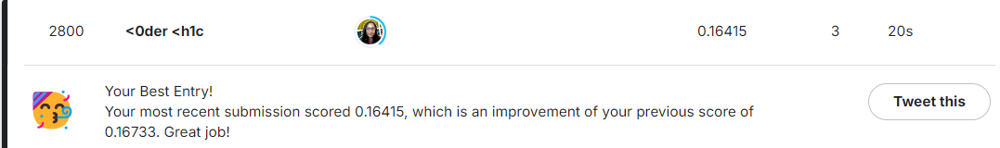

Thank you for reading! 